In [314]:
## formulate the real problem
import numpy as np
from pyswarm import pso

# Define the objective (to be minimize)
def tradeoff(eta, *args):
    import numpy as np
    rho, sigma, t, gama, k, r = args
    h = []
    m = []
    v = []
    u = []
    q = []
    p = []
    b1 = []
    b2 = []
    a1= []
    a2 = []
    va = []
    c =[]
    for i in range(t):
        if i==0:
            eta[i] = 0.2
            h1 = np.square(eta[i]) + np.square(gama)
            m1 = np.square(eta[i]*gama)
            
            v0 = 0.01
            v1 = np.square(rho) * v0 + np.square(sigma)
            u1 = 0.9
            #q1 = 0.9
            p1 = (k-1)/k*u1
            q1 = 1/k + p1
            
            b1_1 = np.square(gama)*v1*(1-r/k)
            b2_1 = (v1+np.square(gama))*(1-r/k)-r*(k-1)/k*(v1+np.square(gama)*u1)
            a1_1 = np.square(np.square(gama)*v1*(1-r/k))
            a2_1 = np.square(gama)*(np.square((1-r)*v1)+np.square((1-r*q1)*gama*sigma)+np.square((1-r*q1)*rho*gama)*v1)
            
            va_1 = 1
            
            c1 = 0.1/eta[i]
            
            h.append(h1)
            m.append(m1)
            v.append(v1)
            u.append(u1)
            p.append(p1)
            q.append(q1)
            b1.append(b1_1)
            b2.append(b2_1)
            a1.append(a1_1)
            a2.append(a2_1)
            va.append(va_1)
            c.append(c1)
        else:
            h2 = np.square(eta[i]) + np.square(gama)
            m2 = np.square(eta[i]*gama)
            l = h2*v[i-1]+m2
            
            w_theta = rho*m2/l
            w_x = np.square(eta[i])*v[i-1]/l
            
            v2 = v[i-1]*w_theta*rho+np.square(sigma)
            u2 = (1-w_theta/rho)*np.square(eta[i])/(np.square(eta[i])+np.square(gama))+w_theta/rho*u[i-1]
            
            p2 = (k-1)/k*u2
            q2 = 1/k + p2
            
            #q2 = (q[i-1]-1/k-(k-1)/k*w_x)/(w_theta/rho)+1/k
            
            b1_2 = np.square(gama)*v2*(1-r/k)
            b2_2 = (v2+np.square(gama))*(1-r/k)-r*(k-1)/k*(v2+np.square(gama)*u2)
            a1_2 = np.square(np.square(gama)*v2*(1-r/k))
            a2_2 = np.square(gama)*(np.square((1-r)*v2)+np.square((1-r*q2)*gama*sigma)+np.square((1-r*q2)*rho*gama)*va[i-1])
            
            va_2 = np.square(eta[i])*(a1[i-1]+a2[i-1]*np.square(eta[i]))/np.square(b1[i-1]+b2[i-1]*np.square(eta[i]))
            c2 = 0.1/eta[i]
            
            h.append(h2)
            m.append(m2)
            v.append(v2)
            u.append(u2)
            p.append(p2)
            q.append(q2)
            b1.append(b1_2)
            b2.append(b2_2)
            a1.append(a1_2)
            a2.append(a2_2)
            va.append(va_2)
            c.append(c2)
    su = sum(va)+sum(c) 
    print('Cost: '+str(sum(c)))
    print('Variance Sum: '+str(sum(va)))
    print('Variance: '+str(va))
    print(su) 
    return su

def constraints(eta, *args):
    import numpy as np
    rho, sigma, t, gama, k, r = args
    v = np.array([])
    u = np.array([])
    
    for i in range(t):
        if i==0:
            v0 = 4
            v1 = np.square(rho) * v0 + np.square(sigma)
            u1 = 0.9
            
            v=np.append(v,v1)
            u=np.append(u,u1)
        else:
            h = np.square(eta[i]) + np.square(gama)
            m = np.square(eta[i]*gama)
            l = h*v[i-1]+m
            
            w_theta = rho*m/l
            w_x = np.square(eta[i])*v[i-1]/l
            
            v2 = v[i-1]*w_theta*rho+np.square(sigma)
            u2 = (1-w_theta/rho)*np.square(eta[i])/(np.square(eta[i])+np.square(gama))+w_theta/rho*u[i-1]
            
            v=np.append(v,v2)
            u=np.append(u,u2)
    con=1-u        
    return con

def constraints1(eta, *args):
    import numpy as np
    rho, sigma, t, gama, k, r = args
    c =[]
    for i in range(t):
        c1 = 0.1/eta[i]
        c.append(c1)
    cost = sum(c)  
    con = t*2 - cost
    return con


# Define the other parameters
rho = 1
sigma = 1
t = 10
gama = 1
k = 2
r = 0.5

args = (rho, sigma, t, gama, k, r)

# Define the lower and upper bounds for eta for t time steps, respectively
lb = np.ones(t)*0.01
ub = np.ones(t)*60

xopt, fopt = pso(tradeoff, lb, ub, args=args, f_ieqcons= constraints, swarmsize=200, maxiter=2000)

Cost: 0.569959866475
Variance Sum: 6.77775677411
Variance: [1, 0.76192840180846599, 0.68200330093276174, 0.63887942846011059, 0.62732272080037776, 0.60806745537536389, 0.61823616183503216, 0.61321084164524875, 0.61093911579755866, 0.61716934745044905]
7.34771664058
Cost: 0.561139680735
Variance Sum: 6.77805385022
Variance: [1, 0.76147132210064861, 0.6818460270124802, 0.63903524271717527, 0.62730957027393508, 0.60319608753663345, 0.61934121606129222, 0.61119959729766571, 0.61785921310750991, 0.61679557411445174]
7.33919353096
Cost: 0.637129498867
Variance Sum: 6.68232409144
Variance: [1, 0.72532236659784877, 0.67093756813543703, 0.63158387267674265, 0.62460972358543998, 0.61545723203091673, 0.61883818504642063, 0.61349938614221589, 0.61725399984426454, 0.56482175737874885]
7.3194535903
Cost: 0.524921383094
Variance Sum: 6.8048360278
Variance: [1, 0.76239053466807261, 0.68215398375135727, 0.63944069475223975, 0.62726705283401019, 0.62063772211349333, 0.61926052230040485, 0.61781601167962

Cost: 0.651108891055
Variance Sum: 6.56360248068
Variance: [1, 0.76241779477953242, 0.66474845374542857, 0.61898381103516509, 0.62537763580414107, 0.61811147780610298, 0.43539285133198241, 0.63019768472673299, 0.58896514333125027, 0.61940762811664041]
7.21471137173
Cost: 0.533004456334
Variance Sum: 6.80029335598
Variance: [1, 0.75887747067362366, 0.68150726576773957, 0.63902277185705547, 0.62717647624447803, 0.62046022943665746, 0.61916730351708404, 0.61822153025161442, 0.61810934288023578, 0.6177509653491482]
7.33329781231
Cost: 0.550647614118
Variance Sum: 6.78977395751
Variance: [1, 0.76179296019082277, 0.68220933998736188, 0.63900329436717751, 0.62366452419645291, 0.62033348944384781, 0.61871752297950466, 0.60938567591011306, 0.61802749497263487, 0.61663965546508592]
7.34042157163
Cost: 0.530154242621
Variance Sum: 6.80305244904
Variance: [1, 0.7622960609415852, 0.68170092616872047, 0.63860985526627989, 0.62727158798181792, 0.62087929641499529, 0.61924160548225693, 0.6183383429357

Variance: [1, 0.76201981265635477, 0.67640664115483906, 0.63934894688684674, 0.62554243998828274, 0.57195936032260497, 0.50132971842867191, 0.61526601893424959, 0.60015051258656349, 0.61558025481941081]
7.25443312207
Cost: 20.53856112
Variance Sum: 5.0663320854
Variance: [1, 9.9986906372898435e-05, 9.9991108038600769e-05, 0.51977559204777501, 0.50407843707615319, 0.59651150299050559, 0.59910134812447213, 0.61473050007954078, 0.61494532292390836, 0.61698940414515524]
25.6048932054
Cost: 0.541112878436
Variance Sum: 6.79386901627
Variance: [1, 0.76216671626772969, 0.67464831416946158, 0.63988904100104127, 0.6253277175440336, 0.61885899880756767, 0.61903036881941675, 0.6180754117228735, 0.61793332564360626, 0.61793912229719417]
7.33498189471
Cost: 10.5289525348
Variance Sum: 6.11229388202
Variance: [1, 9.9986906372898435e-05, 0.87055913132630791, 0.50394804482163813, 0.66154326891244175, 0.60008471988882617, 0.6244615215139695, 0.61520678781161753, 0.6188688743210019, 0.61752154651815627]

Variance: [1, 0.76210296511241571, 0.6286771635556504, 0.64226071627541992, 0.61961118681521032, 0.61991541264187733, 0.618074154229036, 0.61821834359437644, 0.61796035503365365, 0.61681582778857869]
7.30796234258
Cost: 20.53209046
Variance Sum: 5.07109979088
Variance: [1, 9.9986906372898435e-05, 9.9991108038600769e-05, 0.5197076316211765, 0.50406635890308038, 0.59983222665817681, 0.60044134673578198, 0.614994379182911, 0.61533491268533191, 0.61652295707549132]
25.6031902509
Cost: 10.5309134159
Variance Sum: 6.11931386952
Variance: [1, 9.9986906372898435e-05, 0.87897985764930153, 0.50400151519809677, 0.66275842388920658, 0.59975248089623945, 0.62245481188221741, 0.61526932536532919, 0.61852267213952572, 0.61747479559202822]
16.6502272855
Cost: 0.535827255197
Variance Sum: 6.79930715947
Variance: [1, 0.76122771491401309, 0.67906614695112932, 0.63879153531879929, 0.62693434860201624, 0.6202033568135058, 0.61878811001644063, 0.61825199033927536, 0.61805855044326619, 0.61798540606751295]
7

Variance: [1, 0.75947989437595831, 9.998615216611383e-05, 0.79145993178590146, 0.50400685778351695, 0.64573466664802526, 0.60030845046379222, 0.62208871965297141, 0.6153545897523206, 0.61816825148233034]
16.6929665979
Cost: 0.534388622099
Variance Sum: 6.8003300437
Variance: [1, 0.76179484679556386, 0.67872771524000186, 0.63943295104164444, 0.62680000572708239, 0.62062424843641772, 0.61887941367979216, 0.61831664880827575, 0.61791775884912925, 0.61783645511934215]
7.3347186658
Cost: 0.545441008285
Variance Sum: 6.78948265553
Variance: [1, 0.75355098478819116, 0.67828902166397553, 0.63833470454471808, 0.62666805777191736, 0.61969468862742383, 0.61875728311391509, 0.61819230014103765, 0.61803226972009095, 0.61796334515543883]
7.33492366381
Cost: 10.6053924153
Variance Sum: 5.87479280064
Variance: [1, 9.9986906372898435e-05, 0.68026008084621459, 0.49986420692555705, 0.63020518942387649, 0.59996418593670908, 0.61764871083148087, 0.61286096675032176, 0.61705607955983799, 0.61683339345978283

Cost: 10.6109068359
Variance Sum: 5.83397721353
Variance: [1, 9.9986906372898435e-05, 0.65339857405968049, 0.50047415128759176, 0.62667224129135568, 0.58715115609308277, 0.61789156215979701, 0.61332434979969541, 0.61793766223818936, 0.6170275296919201]
16.4448840494
Cost: 0.67891969931
Variance Sum: 6.33629884039
Variance: [1, 0.32373272485391902, 0.72692860948440507, 0.56927369176643128, 0.6352253153909968, 0.60848544741463872, 0.62019345606274545, 0.61649370753588095, 0.61826235001219809, 0.61770353786656518]
7.0152185397
Cost: 10.5310041468
Variance Sum: 6.11123347978
Variance: [1, 9.9986906372898435e-05, 0.869592417475616, 0.50368104130846281, 0.66129090749854158, 0.60056884319867154, 0.62431271969583124, 0.61535713497264677, 0.61878394654162761, 0.61754648218549335]
16.6422376265
Cost: 0.648900871456
Variance Sum: 6.50259237422
Variance: [1, 0.62796160289367231, 0.5634184817793193, 0.62435392127452771, 0.60982177005457483, 0.60870287413281787, 0.6164077356402482, 0.616548137838654

Variance Sum: 6.7906854254
Variance: [1, 0.7620590253121311, 0.67111835773537409, 0.63929549293739674, 0.62553681947772033, 0.62036473623066579, 0.61864369560960686, 0.61816091469900825, 0.61804073943487925, 0.61746564396419523]
7.33685142456
Cost: 0.608271165378
Variance Sum: 6.6546002908
Variance: [1, 0.66641636389082404, 0.65666703087816336, 0.62554792702557471, 0.62369510906083936, 0.61142216122830029, 0.61825649656379111, 0.61691939326667167, 0.61795841489741898, 0.61771739399240999]
7.26287145618
Cost: 0.657594411732
Variance Sum: 6.46204206021
Variance: [1, 0.7430959292786663, 0.38604545723082023, 0.66657900368416989, 0.58087875309061265, 0.61987634018732973, 0.61238102022984964, 0.61815543301505016, 0.61712809923669465, 0.61790202425746965]
7.11963647194
Cost: 0.608178283155
Variance Sum: 6.61565104724
Variance: [1, 0.74931660996997018, 0.52323492134406158, 0.6484650857440929, 0.60350972762195765, 0.62208739561192783, 0.61514693864228276, 0.61850325603832768, 0.6175328390748747

Variance Sum: 6.34591027714
Variance: [1, 0.32714619580632065, 0.73031891995991027, 0.57012387105252449, 0.635571637148303, 0.61022297750145815, 0.62002235523168947, 0.6166956641407314, 0.61817339916039404, 0.61763525713572209]
7.01964095012
Cost: 0.56360205399
Variance Sum: 6.76769766047
Variance: [1, 0.73657026743211296, 0.68285951245685439, 0.63271527969543939, 0.62747671381123493, 0.61607823281338447, 0.61855074681668065, 0.61760863524425935, 0.61802425057040877, 0.61781402162936239]
7.33129971446
Cost: 0.739156316333
Variance Sum: 6.24065453647
Variance: [1, 0.19434425707833386, 0.78048581286487784, 0.54522460098496917, 0.64418367048832081, 0.60494666514784445, 0.61991048675077065, 0.61586348119256284, 0.61817106814706446, 0.61752449381842589]
6.97981085281
Cost: 20.5318992579
Variance Sum: 5.06974289335
Variance: [1, 9.9986906372898435e-05, 9.9991108038600769e-05, 0.51920051743460971, 0.50401646420052459, 0.59830350166997015, 0.60022715045438046, 0.61500137005556688, 0.6153419245

Variance: [1, 0.13255300802961523, 9.9988202284706501e-05, 0.56683953056831893, 0.50403269908557358, 0.60743965727688942, 0.60030092399087109, 0.61638076711158729, 0.61534911699152928, 0.6176489248405046]
16.0393517427
Cost: 1.05891625424
Variance Sum: 5.3802273279
Variance: [1, 0.13275227933433911, 0.11012513528570482, 0.55042894517651952, 0.52806652082128769, 0.60535926362925552, 0.60396716500954584, 0.61604615381694827, 0.61589079491377163, 0.61759106991592894]
6.43914358215
Cost: 1.00409659865
Variance Sum: 5.48854420653
Variance: [1, 0.092835258395498124, 0.25300038099659894, 0.52772815666132744, 0.55638383892386623, 0.6008470338321299, 0.60834417694094522, 0.61538444157652772, 0.61652911225861906, 0.61749180694090056]
6.49264080518
Cost: 1.05617218415
Variance Sum: 5.40087627093
Variance: [1, 0.16024565836197455, 0.094284824405872089, 0.56112580234779585, 0.52477165858254937, 0.60714830673047726, 0.60348839402638776, 0.61633341942199926, 0.61581916368346501, 0.61765904337104938]


Variance Sum: 5.89072095994
Variance: [1, 0.53733484392946418, 0.060577499615252793, 0.6910514163522794, 0.51768337264004127, 0.62837229841189712, 0.60243683092324019, 0.6194793247828827, 0.615666550484678, 0.61811882279802488]
6.88083440452
Cost: 0.901556138181
Variance Sum: 5.87168667755
Variance: [1, 0.49703847452898559, 0.10170811755778025, 0.66585579178263554, 0.52656714995382115, 0.62397381980488953, 0.60384307231800038, 0.618816725310121, 0.61587279234203951, 0.6180107339491353]
6.77324281573
Cost: 11.2061053165
Variance Sum: 5.10181962461
Variance: [1, 0.021218288804949598, 9.9990465823416159e-05, 0.52685341916501449, 0.50403364040386722, 0.60111865362825234, 0.60019917335699036, 0.61543950456497443, 0.61533815357737165, 0.61751880063957743]
16.3079249411
Cost: 0.542359909634
Variance Sum: 6.79260621695
Variance: [1, 0.75815015153995335, 0.67564130880735507, 0.63893010523874949, 0.62636894521506148, 0.62036143816617995, 0.61898016994575233, 0.61814735934299503, 0.61806654218486

Variance: [1, 0.11893856826515516, 0.1175428027268015, 0.54539938982476022, 0.52958817322281493, 0.60474329960183748, 0.60440452763282315, 0.61596004029867002, 0.61595707383763998, 0.61760108540369152]
6.43419055484
Cost: 1.04029741674
Variance Sum: 5.39473986186
Variance: [1, 0.11024518491044109, 0.15024908499523329, 0.53959650137706106, 0.53628194603547918, 0.60354204973276637, 0.60536633651446714, 0.61578548493945473, 0.61609824162689075, 0.61757503172395989]
6.4350372786
Cost: 0.584966724833
Variance Sum: 6.73473834453
Variance: [1, 0.76042737001504879, 0.66460861257843606, 0.63881337540249172, 0.6247992600386818, 0.57942451827081221, 0.61940439230115496, 0.61217642109376313, 0.6180825244278968, 0.61700187040660714]
7.31970506937
Cost: 0.528430796797
Variance Sum: 6.80323498676
Variance: [1, 0.76129110940278488, 0.68140963204462712, 0.63905007541517933, 0.62721140539924414, 0.62086628003918654, 0.61915352240559918, 0.61829197737689257, 0.61807092697215293, 0.61789005770551042]
7.33

Variance: [1, 0.11107483045513762, 0.15581246513578342, 0.53942107256551142, 0.53741034632280182, 0.60319224001978711, 0.60559728095071252, 0.61572917680160089, 0.61612945289823629, 0.61756233643022063]
6.43592278378
Cost: 1.06160076725
Variance Sum: 5.37188626581
Variance: [1, 0.10857806783394755, 0.13188413019376055, 0.54084729428175049, 0.53253597025315713, 0.60381480580365887, 0.60481351189777433, 0.61581978570345874, 0.61601744282521442, 0.6175752570137174]
6.43348703305
Cost: 1.06557949916
Variance Sum: 5.36820232499
Variance: [1, 0.1156961311805019, 0.12046707821024805, 0.5441944807179685, 0.53019806247915746, 0.60378248784735988, 0.60450763057425261, 0.61581282927872827, 0.61597155809422188, 0.61757206660826891]
6.43378182415
Cost: 0.846081852977
Variance Sum: 6.01237517064
Variance: [1, 0.11963802393443361, 0.66540320888874604, 0.52825261522751488, 0.62733186269327634, 0.60149803773931043, 0.61911860586165635, 0.61548680715245718, 0.61811409933478711, 0.61753190980567263]
6.85

6.43339434893
Cost: 0.977248086674
Variance Sum: 5.49504852031
Variance: [1, 0.11379006094009105, 0.23401602620119102, 0.53440739497302114, 0.55278800718918319, 0.60255229259439558, 0.60784426915349754, 0.6156365051538617, 0.6164613288861801, 0.61755263522004067]
6.47229660699
Cost: 1.10004062862
Variance Sum: 5.34052990981
Variance: [1, 0.090995094520932782, 0.12565058273482393, 0.53601466944436271, 0.53123099587087008, 0.60282354299275998, 0.60459804879904055, 0.61567520418538801, 0.61598480008282452, 0.61755697117904151]
6.44057053843
Cost: 0.53435598198
Variance Sum: 6.8005317099
Variance: [1, 0.76001820160726019, 0.68096175205861165, 0.63912593375128779, 0.62715424822118471, 0.62079492499600897, 0.61845693102664501, 0.61828495452419197, 0.61800331201893122, 0.61773145170015353]
7.33488769188
Cost: 0.558316395954
Variance Sum: 6.77975996151
Variance: [1, 0.76027635510724956, 0.67349623762143407, 0.63848266332613535, 0.62597423709986599, 0.60990742449390756, 0.61915984634717813, 0.6

Variance: [1, 0.76010548878973649, 0.68147907147640852, 0.63855599251536532, 0.62704082233445457, 0.61723969436284964, 0.61889380324544463, 0.61776796774668952, 0.61795836207803667, 0.61778102525788514]
7.33982194007
Cost: 1.05028364103
Variance Sum: 5.3824982153
Variance: [1, 0.11535412367336913, 0.13330515097462114, 0.54278006457413452, 0.53283881168380731, 0.60392090753280248, 0.60485695317001342, 0.61583718282862177, 0.6160229384221475, 0.61758208244064783]
6.43278185633
Cost: 1.07256101003
Variance Sum: 5.36788800385
Variance: [1, 0.092691186592659319, 0.14759596354030108, 0.53456142827908326, 0.53571472043091251, 0.60267066831173433, 0.60535329762788392, 0.61565238039657144, 0.61609573758728142, 0.61755262108831099]
6.44044901389
Cost: 0.558081373629
Variance Sum: 6.78105541804
Variance: [1, 0.75900708925778071, 0.68134855702164765, 0.62547394958097113, 0.62752289189359656, 0.61537852164540219, 0.61893689197699553, 0.61751035999958348, 0.61808351348370316, 0.61779364317830887]
7.

Variance: [1, 0.11420259183634064, 0.11193678207804517, 0.54462247507682537, 0.52841877450597308, 0.60438430987441794, 0.60422574354472236, 0.61590717442330944, 0.61593023819434756, 0.61759050969000384]
6.43575543964
Cost: 0.534030416455
Variance Sum: 6.80040718544
Variance: [1, 0.75949674200660655, 0.68126771548090648, 0.63870967880883778, 0.62722635192443688, 0.62053534174814706, 0.61912878020542739, 0.61820500549692792, 0.6181094168364647, 0.61772815293385963]
7.3344376019
Cost: 1.03961451806
Variance Sum: 5.39287256623
Variance: [1, 0.11780056909853091, 0.13937533561156487, 0.5429663693214748, 0.53408456603506271, 0.60402078307411688, 0.60512634894728745, 0.61585207112623297, 0.61606260335972596, 0.6175839196576649]
6.43248708429
Cost: 1.05781553125
Variance Sum: 5.37488279878
Variance: [1, 0.11269425377008582, 0.12949867785155922, 0.54236473576050948, 0.53205319548184027, 0.60402815724287795, 0.6047935890252425, 0.61585348150627817, 0.61601404002387561, 0.6175826681191865]
6.43269

6.43234740507
Cost: 0.570580319126
Variance Sum: 6.77321982965
Variance: [1, 0.7613825214823724, 0.66983538218767003, 0.63940416098776232, 0.62351772132416505, 0.60924869965453599, 0.61843863854704495, 0.6164184948205278, 0.61746005983712482, 0.6175141508087918]
7.34380014878
Cost: 1.04099840352
Variance Sum: 5.39118800568
Variance: [1, 0.11888578965752923, 0.13631271248359031, 0.54357150854143321, 0.53345865885258814, 0.60437026125130111, 0.60504390291382304, 0.61590384246320962, 0.61605038891739516, 0.61759094059595954]
6.4321864092
Cost: 0.960422211493
Variance Sum: 5.51546230376
Variance: [1, 0.12258102521220375, 0.24136489477847128, 0.53645564211756325, 0.5542060798495595, 0.60292110903060336, 0.60817976508898575, 0.61568434473616207, 0.61651094275927032, 0.61755850018621361]
6.47588451525
Cost: 1.0147386804
Variance Sum: 5.43190399745
Variance: [1, 0.10693761408240315, 0.18643237205442889, 0.53577022797703044, 0.54351759325548699, 0.60311945593231486, 0.60657306432248814, 0.61571

Cost: 1.04291530131
Variance Sum: 5.38900010222
Variance: [1, 0.1197458968280426, 0.13312759174503724, 0.54418522972598704, 0.53280909920873554, 0.60460583646955435, 0.60495396675195612, 0.61593894620656997, 0.61603712198356197, 0.61759641329597414]
6.43191540352
Cost: 1.0536736817
Variance Sum: 5.37947186065
Variance: [1, 0.12268218440017827, 0.12115285933719333, 0.54631921499671865, 0.53034572341300734, 0.60484606543209296, 0.60456919281906907, 0.61597464972391203, 0.61598060994294879, 0.61760136058742776]
6.43314554236
Cost: 1.05999633919
Variance Sum: 5.3726920091
Variance: [1, 0.11553824499441659, 0.12376600936663774, 0.54382658821152541, 0.53087603575739817, 0.60453199751117703, 0.60463948223357256, 0.61592839670068289, 0.61599083403465615, 0.61759442028592415]
6.43268834829
Cost: 0.535659027951
Variance Sum: 6.80082989184
Variance: [1, 0.76049487066109867, 0.68146019831831173, 0.63915917839127268, 0.6272222197388152, 0.62059474701051975, 0.61833383986070745, 0.61826530136567937,

Cost: 1.04192489818
Variance Sum: 5.38979999528
Variance: [1, 0.11784431402492261, 0.13584235888864701, 0.54335080328196617, 0.53336154459047058, 0.60474921561711781, 0.60504415623960051, 0.61595964048543717, 0.61605043039154006, 0.61759753175716092]
6.43172489346
Cost: 0.558882917469
Variance Sum: 6.77655141314
Variance: [1, 0.76164365804207179, 0.67982627817720898, 0.63768645137437063, 0.62705193837732454, 0.60054240239961554, 0.61885666945256579, 0.6153694637786763, 0.61807675761419001, 0.61749779392408799]
7.33543433061
Cost: 0.558783310083
Variance Sum: 6.77594271886
Variance: [1, 0.75339990904465581, 0.68115387414491191, 0.63777185058253105, 0.62717906509835974, 0.6054150255873646, 0.61930266901608666, 0.61607102464000907, 0.61803398779914231, 0.61761531294422278]
7.33472602894
Cost: 1.04445383249
Variance Sum: 5.38739353581
Variance: [1, 0.1177606739138617, 0.13398592925767858, 0.54348680213344258, 0.53298119887947804, 0.60461658713245447, 0.60498530943185402, 0.6159401460633385

Cost: 1.03902039805
Variance Sum: 5.39287732894
Variance: [1, 0.12192649584534809, 0.13383763480809446, 0.54478601567240237, 0.53295644937470432, 0.60477725351766221, 0.60498902243109243, 0.61596392404140943, 0.61604236656928202, 0.61759816667972645]
6.43189772699
Cost: 1.0413302607
Variance Sum: 5.39041278675
Variance: [1, 0.1200186491909498, 0.13378936647497741, 0.54418850344114222, 0.5329437988100143, 0.60486560930790845, 0.60498736090921557, 0.61597718014896918, 0.61604212270357894, 0.61760019576158942]
6.43174304744
Cost: 1.04475099352
Variance Sum: 5.38697095174
Variance: [1, 0.11755895711105716, 0.13371352705759185, 0.54346669669097114, 0.532925124038924, 0.60473199540667111, 0.60497915307276984, 0.61595731702806633, 0.61604084099896173, 0.61759734033651514]
6.43172194526
Cost: 1.03926842837
Variance Sum: 5.39248581313
Variance: [1, 0.11973703157219084, 0.13590745801196774, 0.54391097136852951, 0.53337739367017745, 0.60488398173022395, 0.60503871391272845, 0.61597995616261503, 0

6.43190850142
Cost: 1.04590780761
Variance Sum: 5.3857714438
Variance: [1, 0.11825450024977424, 0.13166860234145522, 0.5438764558449698, 0.53250632877458925, 0.60493880498480468, 0.60490677344315957, 0.61598805679028379, 0.61603033633447946, 0.61760158503931872]
6.43167925141
Cost: 1.04455299618
Variance Sum: 5.38699234757
Variance: [1, 0.11755473443167309, 0.13354351462115013, 0.54348224147284474, 0.53289011062301828, 0.60491193186902315, 0.60498407533061938, 0.61598395269074757, 0.61604167661383724, 0.61760010992155256]
6.43154534375
Cost: 1.03597591001
Variance Sum: 5.39581958507
Variance: [1, 0.12202024583322826, 0.13608951662729882, 0.54458314119114515, 0.53341755976803995, 0.60500034599072539, 0.60505692647463061, 0.61599704814964518, 0.61605231670084837, 0.61760248433027243]
6.43179549507
Cost: 1.0470068085
Variance Sum: 5.38470990241
Variance: [1, 0.11644711615866708, 0.13294524623348378, 0.54318466560450784, 0.53276495830505943, 0.60480980220521718, 0.60495351666211916, 0.6159

Cost: 1.04781775404
Variance Sum: 5.38357874298
Variance: [1, 0.11603103357152456, 0.13217938372208005, 0.54316449955897794, 0.53260841911100942, 0.60500928625600137, 0.60494790015872357, 0.61599866528624803, 0.61603647837401543, 0.6176030769456784]
6.43139649703
Cost: 0.542803008691
Variance Sum: 6.79412591626
Variance: [1, 0.75578371692465429, 0.68047373239469933, 0.63806674360447324, 0.62705070491304127, 0.61970269768093356, 0.61916793261586023, 0.61808623516597583, 0.61808379363876187, 0.61771035932549168]
7.33692892496
Cost: 1.04500046878
Variance Sum: 5.38636432347
Variance: [1, 0.11725413622207696, 0.13314911877747193, 0.54343287547029295, 0.53280868646060997, 0.60508934910555545, 0.60497463000962015, 0.61601010716902194, 0.61604038270259109, 0.61760503755622076]
6.43136479225
Cost: 1.04462391303
Variance Sum: 5.38696184927
Variance: [1, 0.11775696924961647, 0.13335080492772455, 0.54356369918758662, 0.53285109620798421, 0.60484483846174075, 0.60497951503439951, 0.615974079321551

Variance: [1, 0.11696808840804367, 0.13270891145078753, 0.54339574611977159, 0.53271831873050279, 0.60515928219221748, 0.60496728208580064, 0.61602037465425485, 0.61603933860624671, 0.6176060516397156]
6.43125770636
Cost: 0.558484264315
Variance Sum: 6.7735438911
Variance: [1, 0.76095580861349699, 0.65780693342807683, 0.640078739065289, 0.62366895662872857, 0.62002802962229298, 0.61730106478354885, 0.61820720406353868, 0.61782802363548006, 0.61766913126006262]
7.33202815542
Cost: 0.544910607178
Variance Sum: 6.79601884658
Variance: [1, 0.76196862856185199, 0.6779815366226708, 0.63911989625179122, 0.62675926297340157, 0.61911290015652498, 0.61770612351663601, 0.61803675759117283, 0.6177810422143647, 0.61755269868921936]
7.34092945376
Cost: 1.04502906673
Variance Sum: 5.38627327764
Variance: [1, 0.11705286415810313, 0.13327466979328051, 0.5433629241484208, 0.53283442083930255, 0.60510353858021715, 0.60498560307838112, 0.61601214903538426, 0.61604197041136588, 0.61760513759604829]
6.43130

Variance: [1, 0.11743064220229425, 0.13281811461243914, 0.54352788920238349, 0.53274135408289491, 0.60528206167486143, 0.60497503597816493, 0.61603859551664175, 0.6160404784984127, 0.61760881285735392]
6.43112367177
Cost: 0.564350055779
Variance Sum: 6.75712988211
Variance: [1, 0.72468197251253574, 0.68499939164335322, 0.63393030474368295, 0.62612210472119034, 0.61591455616077062, 0.61813911840391078, 0.61758794816411167, 0.61789747513557558, 0.61785701062666198]
7.32147993789
Cost: 1.04360369422
Variance Sum: 5.38750723777
Variance: [1, 0.11825634085287831, 0.13275448146539726, 0.54378551113117957, 0.53272945753606149, 0.60531137402982083, 0.60497697153167873, 0.6160429385143914, 0.61604075405147063, 0.6176094086587024]
6.43111093199
Cost: 1.04563825502
Variance Sum: 5.3855634436
Variance: [1, 0.1167992571781644, 0.13287077348708545, 0.5433298216072262, 0.53275142223719563, 0.60516330913782967, 0.60498036249697285, 0.61602102345650156, 0.61604124136699767, 0.617606232635317]
6.4312016

Variance Sum: 5.38691719337
Variance: [1, 0.11757846814610011, 0.1330108585462895, 0.5435530799082321, 0.53278108380418876, 0.60531334668883385, 0.60498580470935204, 0.61604315244778873, 0.61604206362340908, 0.61760933549618025]
6.43107322014
Cost: 0.53320277447
Variance Sum: 6.80237922596
Variance: [1, 0.76190639151003692, 0.68127740057616437, 0.63930984557941439, 0.62710236885921167, 0.62035420987790935, 0.61896092557437921, 0.61823627390770819, 0.61806900542882059, 0.6171628046487011]
7.33558200043
Cost: 1.04413149227
Variance Sum: 5.38693860449
Variance: [1, 0.11776222898722462, 0.1328041934727861, 0.54363011578123011, 0.53273897263451142, 0.60532824086760662, 0.60497849684147831, 0.6160454473663165, 0.61604098680122465, 0.61760992173998108]
6.43107009676
Cost: 0.544453601079
Variance Sum: 6.79654760502
Variance: [1, 0.76042367770314967, 0.68157738196116935, 0.63852589144452565, 0.62715454424227934, 0.61695287415410316, 0.61869096816611957, 0.61769026667838678, 0.61785113183988827,

Variance Sum: 6.78749717848
Variance: [1, 0.75036686988879964, 0.67881986011421602, 0.63799034333274474, 0.62678146892694508, 0.62076039442180975, 0.61908996052303478, 0.61811318119312864, 0.61788361076291487, 0.61769148931726359]
7.33269442459
Cost: 1.04505530746
Variance Sum: 5.38593887088
Variance: [1, 0.11655026699645193, 0.13330466092299212, 0.543214900215367, 0.53284013826527943, 0.60533216826608383, 0.60499702218262286, 0.61604582413581543, 0.61604376833019681, 0.61761012156392581]
6.43099417834
Cost: 1.0445322269
Variance Sum: 5.38646567821
Variance: [1, 0.1171406891935306, 0.13306387469050546, 0.5434200200517787, 0.53279163283197228, 0.60536041674784458, 0.60498609023744587, 0.61605007317906146, 0.61604214561428916, 0.61761073566563041]
6.43099790511
Cost: 0.525073701887
Variance Sum: 6.80437384771
Variance: [1, 0.76169021622946775, 0.68208251769711592, 0.63894522694920275, 0.62733974368238365, 0.62096241464126212, 0.61911172093963029, 0.61837203311319444, 0.61811085341715222,

Variance: [1, 0.11781062303243062, 0.13295443678341112, 0.54363299322864234, 0.53276994837250613, 0.60545881472873631, 0.60498894285869331, 0.61606473150216445, 0.61604254075150544, 0.61761273950715789]
6.43089507971
Cost: 1.0426100074
Variance Sum: 5.38843313062
Variance: [1, 0.1160468690589672, 0.13611860242260945, 0.54278481992044836, 0.5334157348822488, 0.60527734595177851, 0.60508631667384061, 0.61603784922540872, 0.61605683759350383, 0.61760875489255185]
6.43104313802
Cost: 1.04392320067
Variance Sum: 5.38703059899
Variance: [1, 0.11766065093251163, 0.13291408343373412, 0.54359101700614798, 0.53276146254738765, 0.60540628879144687, 0.60498644432237625, 0.61605695602593924, 0.61604215358996151, 0.61761154234515869]
6.43095379967
Cost: 1.04362463734
Variance Sum: 5.38727373502
Variance: [1, 0.1177574855310513, 0.13296415930598568, 0.54361592367065203, 0.53277186827108236, 0.60545607998020456, 0.60498883883845922, 0.6160642505352244, 0.61604252155135464, 0.61761260733531409]
6.43089

6.43085913912
Cost: 1.04340012499
Variance Sum: 5.38742473929
Variance: [1, 0.11760668684715361, 0.13321353219894935, 0.54354497746681152, 0.53282282850760465, 0.60551013234045448, 0.60499681398946792, 0.61607214006153777, 0.61604370898200811, 0.617613918895625]
6.43082486428
Cost: 1.04375523308
Variance Sum: 5.38707917015
Variance: [1, 0.11739125159182533, 0.13317656056757202, 0.54348415726987453, 0.53281497611642969, 0.60548983862622774, 0.60499615659567973, 0.61606913586168477, 0.61604361382134076, 0.6176134797014341]
6.43083440323
Cost: 1.04354127307
Variance Sum: 5.38727625096
Variance: [1, 0.11753347136721888, 0.13316786667037081, 0.54352785953861349, 0.53281337458391653, 0.60550775618003549, 0.60499653979008439, 0.61607179687744273, 0.61604366924726228, 0.61761391670224264]
6.43081752402
Cost: 0.536707122402
Variance Sum: 6.80165391198
Variance: [1, 0.76221079699586736, 0.68124020178655587, 0.63889649042195817, 0.62712749780728361, 0.62051462672337443, 0.61878564819937187, 0.617

6.43075901653
Cost: 0.543277765198
Variance Sum: 6.79384452489
Variance: [1, 0.76214501952166525, 0.68142671744590988, 0.6377950871503868, 0.62726822145594807, 0.61320906137791276, 0.61890679401991222, 0.61723778448318056, 0.61808152712212883, 0.61777431231780056]
7.33712229009
Cost: 0.535204100489
Variance Sum: 6.80012592787
Variance: [1, 0.76162787567742052, 0.6819053379487966, 0.63891379400029125, 0.62727728640206071, 0.61755984501538619, 0.61918043799187061, 0.61785831053026818, 0.61792578663570308, 0.61787725366339163]
7.33533002835
Cost: 1.0430729995
Variance Sum: 5.38768660528
Variance: [1, 0.11774932188469765, 0.13322387528981752, 0.54358694671088426, 0.53282513661161934, 0.6055628321217178, 0.60499943921208965, 0.61607993103599001, 0.61604410578419999, 0.61761501662759055]
6.43075960478
Cost: 1.04338041511
Variance Sum: 5.38737930529
Variance: [1, 0.1176601099920271, 0.13305347876930024, 0.54357628220204579, 0.53279005017802139, 0.6055673594275659, 0.60499318787191925, 0.61608

Cost: 1.04378841656
Variance Sum: 5.38688141752
Variance: [1, 0.11731834941093225, 0.13294756461172938, 0.54348170783236227, 0.5327679000459391, 0.60562629244027955, 0.6049909233063776, 0.61608929241162302, 0.61604287152580395, 0.61761651593693956]
6.43066983408
Cost: 0.538029304625
Variance Sum: 6.79920648367
Variance: [1, 0.76161677717668597, 0.67894054128294445, 0.63832730340262567, 0.62684268310669888, 0.62057598162275662, 0.61899445848428358, 0.61823964324655134, 0.61785958820508025, 0.61780950714025751]
7.33723578829
Cost: 1.04363886166
Variance Sum: 5.38707138486
Variance: [1, 0.11738546276404851, 0.13307222790894169, 0.54349046371703802, 0.53279384258137374, 0.60559148445344391, 0.60499457739333162, 0.61608418193682146, 0.61604340879100572, 0.61761573531823966]
6.43071024653
Cost: 1.04386502746
Variance Sum: 5.38684415103
Variance: [1, 0.11730339128151744, 0.13296772378783378, 0.54347746722227774, 0.53277202451629935, 0.60558950294336322, 0.60499150366565946, 0.6160838894067044

6.4306648021
Cost: 1.04280873329
Variance Sum: 5.38782434375
Variance: [1, 0.11794720319255031, 0.13300707891465693, 0.54366961494610055, 0.53278101799368138, 0.60566850803656402, 0.60499459258855248, 0.61609554511791831, 0.61604340988116579, 0.61761737307740683]
6.43063307704
Cost: 1.04284536412
Variance Sum: 5.38779384698
Variance: [1, 0.11779850629513733, 0.13316616900481212, 0.54360751889770198, 0.53281338361526542, 0.60565335809825538, 0.60500031305804192, 0.61609329903427601, 0.61604424683026515, 0.61761705214515039]
6.4306392111
Cost: 1.04316634611
Variance Sum: 5.38759480924
Variance: [1, 0.11774243183479444, 0.13315723487166781, 0.54359249572584545, 0.53281151750587552, 0.60555506822807936, 0.60499837225495601, 0.6160788047656649, 0.61604394898098935, 0.61761493507533849]
6.43076115536
Cost: 1.04277448506
Variance Sum: 5.38786676337
Variance: [1, 0.1177914471407509, 0.13324104443061785, 0.54359935052671904, 0.53282881986419206, 0.60564987556118988, 0.6050019871653407, 0.616092

Variance Sum: 5.38634837667
Variance: [1, 0.11737765683466138, 0.13233585301902168, 0.54356074212628969, 0.53264337951419938, 0.60569894746581998, 0.60497302926977092, 0.61610014786268597, 0.61604025124584705, 0.61761836933253933]
6.43058093269
Cost: 1.04427358394
Variance Sum: 5.38627705315
Variance: [1, 0.11737488487009425, 0.13225396394558966, 0.54356868271421954, 0.53262685083338546, 0.60571986561077351, 0.60497078062561038, 0.61610323513878762, 0.61603992120757889, 0.61761886820630185]
6.43055063709
Cost: 0.546390766399
Variance Sum: 6.79106282757
Variance: [1, 0.76142664291516549, 0.67192557708866385, 0.63923378016332255, 0.62533862248025895, 0.6206454710373579, 0.61855892761551812, 0.61818422635531745, 0.61800609876899626, 0.61774348114583866]
7.33745359397
Cost: 1.04399735616
Variance Sum: 5.38651751283
Variance: [1, 0.11739711431496787, 0.13241274962889407, 0.54355901528427519, 0.53265919378790383, 0.60574640592877416, 0.60497590811906499, 0.61610707702678624, 0.61604067955581

Variance Sum: 6.7632828755
Variance: [1, 0.7612432456037227, 0.64910295894464443, 0.64085387583638709, 0.62066326137168581, 0.62024691902435702, 0.61725777328113285, 0.61824953843291408, 0.61781796866238425, 0.61784733434066508]
7.32709410341
Cost: 0.542793445158
Variance Sum: 6.79848750493
Variance: [1, 0.76086749121321862, 0.68151988897455673, 0.6388353519890857, 0.62723737739811003, 0.6195258826102138, 0.61833026092666876, 0.61809571538983843, 0.61794839948878777, 0.61612713693557397]
7.34128095008
Cost: 1.04387029586
Variance Sum: 5.38662384773
Variance: [1, 0.11739213546616213, 0.13249642529207328, 0.54354907327122715, 0.53267605608594648, 0.60576153096903229, 0.60497861369688799, 0.61610928779492313, 0.6160410834618445, 0.61761964168890338]
6.43049414358
Cost: 1.04400925458
Variance Sum: 5.38650800468
Variance: [1, 0.11734045703466409, 0.13247076627462043, 0.54353572387079474, 0.53267058400306166, 0.60574599141813512, 0.60497723339721798, 0.616107025630379, 0.61604087611525682, 0

6.43047153367
Cost: 0.560794871944
Variance Sum: 6.76397019898
Variance: [1, 0.73073745424266945, 0.68355881502047644, 0.63340254945663554, 0.62763440696384698, 0.6162765656823479, 0.6187829360883349, 0.61767865671333344, 0.61806382209254107, 0.61783499271882791]
7.32476507092
Cost: 0.543453022571
Variance Sum: 6.79094188758
Variance: [1, 0.76195187656147068, 0.68185319809908496, 0.63895668414065532, 0.62725202574002525, 0.6093186681856243, 0.61925159521184969, 0.61664923349524547, 0.61800745505051258, 0.61770115109974388]
7.33439491015
Cost: 1.04327331698
Variance Sum: 5.38719713094
Variance: [1, 0.11748971417290115, 0.13287583160651253, 0.54354281946435057, 0.53275397928976209, 0.60577045019020481, 0.60499118653725947, 0.61611056398824704, 0.61604292931484128, 0.61761965637728289]
6.43047044792
Cost: 1.04325931532
Variance Sum: 5.38717678743
Variance: [1, 0.11749026584610246, 0.13283164256001731, 0.54354733236578634, 0.53274498783219859, 0.60579546206642909, 0.6049898895204302, 0.616

Cost: 0.533000546271
Variance Sum: 6.80220750193
Variance: [1, 0.76161442426947012, 0.68140717451442023, 0.63935114014738026, 0.6271182114560242, 0.62059658494796288, 0.61820222707279004, 0.61827166504395803, 0.61796113601186986, 0.61768493846463357]
7.3352080482
Cost: 1.04347494744
Variance Sum: 5.38694597341
Variance: [1, 0.11745540484458172, 0.13265711280728731, 0.54355384478522228, 0.53270939489344782, 0.60580744393879626, 0.6049842146102159, 0.61611602698273815, 0.61604191018293608, 0.61762062036118837]
6.43042092085
Cost: 0.554601715688
Variance Sum: 6.78636843453
Variance: [1, 0.75175251043052327, 0.6807451143909139, 0.63742557529329269, 0.62699689482374954, 0.61776864859258618, 0.61842856374018451, 0.61779699884093797, 0.617853064835306, 0.61760106357772426]
7.34097015021
Cost: 1.04360438405
Variance Sum: 5.3868566929
Variance: [1, 0.11756254021828001, 0.13247503145007652, 0.54360333932348759, 0.53267212007330778, 0.60579060404303131, 0.60497829688546523, 0.6161135577382717, 0.

Variance: [1, 0.11767984370138168, 0.13276566044220028, 0.54361223178449569, 0.53273169263038744, 0.60586862110575579, 0.60498815580556742, 0.61612504447388605, 0.61604249730287719, 0.61762189672474177]
6.43034117198
Cost: 0.540054911509
Variance Sum: 6.79945200506
Variance: [1, 0.76138673828668479, 0.68159666332339508, 0.63886206096897835, 0.62685910406977574, 0.62060206964567677, 0.61655255239100804, 0.61816020346168643, 0.61767240650045474, 0.61776020641457652]
7.33950691657
Cost: 1.04267720743
Variance Sum: 5.38764725273
Variance: [1, 0.1176880379900128, 0.13293213012290547, 0.54359751058804817, 0.53276574852482372, 0.6058785281337099, 0.60499351878043794, 0.61612645323724513, 0.61604328724438129, 0.61762203810840643]
6.43032446016
Cost: 1.04265016927
Variance Sum: 5.38765484109
Variance: [1, 0.11773508556378487, 0.13286924470883357, 0.54361833606879861, 0.532752944252322, 0.60589338298196249, 0.60499172598945095, 0.61612868865487647, 0.61604302562252622, 0.61762240724833151]
6.430

Variance: [1, 0.75597931385185857, 0.65503194590355429, 0.63866773167644497, 0.62204693539564559, 0.62061093699333014, 0.61846142923235115, 0.6181748062412189, 0.61800206715215888, 0.61788177524075738]
7.32869781216
Cost: 1.04239988713
Variance Sum: 5.38785083835
Variance: [1, 0.11776110281866245, 0.13297686115717541, 0.54361588193426669, 0.53277519981116239, 0.60592614903121933, 0.60499551839532584, 0.61613349359723246, 0.61604358662869474, 0.61762304497735632]
6.43025072548
Cost: 1.04251041875
Variance Sum: 5.3877794636
Variance: [1, 0.11773823490883094, 0.13296688538375756, 0.54360989802161186, 0.53277302588193032, 0.60590071453210337, 0.60499490979409665, 0.6161297464112051, 0.61604349455566532, 0.6176225541111352]
6.43028988235
Cost: 1.04256201736
Variance Sum: 5.38769567789
Variance: [1, 0.1177373473700475, 0.1328714993665675, 0.54361916912652819, 0.53275350155850498, 0.60592291015445565, 0.60499210118160851, 0.61613302404436687, 0.61604308506580074, 0.61762304002055812]
6.430257

6.43022059761
Cost: 1.04239635422
Variance Sum: 5.38782210853
Variance: [1, 0.11784719831102179, 0.13282412718750444, 0.543657503308139, 0.53274374998169016, 0.60595443880902256, 0.60499084689896987, 0.61613765315706159, 0.61604290436347486, 0.61762368651693389]
6.43021846275
Cost: 1.0421323526
Variance Sum: 5.38809473768
Variance: [1, 0.11785375345159432, 0.13306586287023325, 0.54363524780671579, 0.53279339750634269, 0.60594438652198868, 0.60499844722475027, 0.6161361482255745, 0.61604402085295418, 0.61762347321543221]
6.43022709028
Cost: 0.549014644606
Variance Sum: 6.79036216608
Variance: [1, 0.76185275568797828, 0.67273307782270653, 0.6397196635960547, 0.62588739774987079, 0.62053014936101225, 0.61848277495502202, 0.61826137405829629, 0.61798705507921103, 0.61490791777164466]
7.33937681069
Cost: 1.04214864234
Variance Sum: 5.38804682055
Variance: [1, 0.11780202870558253, 0.1330648867814718, 0.54361962913937456, 0.53279309831419341, 0.60596194764236233, 0.60499860135590044, 0.616138

6.43016031905
Cost: 0.535889331546
Variance Sum: 6.80009033785
Variance: [1, 0.75967417966811479, 0.68174673192932811, 0.63796395528720407, 0.62729465229157089, 0.62075602124399276, 0.61881594011245944, 0.61824326035775512, 0.61768537316396388, 0.61791022379569738]
7.3359796694
Cost: 1.04207634554
Variance Sum: 5.38807336816
Variance: [1, 0.1178646923787989, 0.13298547268632985, 0.54364703093638622, 0.53277728734891194, 0.60599113111029101, 0.60499641860711828, 0.61614307141240143, 0.61604372883959302, 0.61762453484189961]
6.4301497137
Cost: 1.04216357882
Variance Sum: 5.38802760026
Variance: [1, 0.11784971984122534, 0.13298920339467707, 0.54364194334422322, 0.53277799252080982, 0.60596549312957115, 0.60499626231651538, 0.61613929685223356, 0.61604370225360994, 0.61762398661187934]
6.43019117909
Cost: 1.04217042205
Variance Sum: 5.38800709046
Variance: [1, 0.11783869971946367, 0.1329754706508065, 0.54363997456140256, 0.53277518371469856, 0.60597355748516024, 0.604995911225224, 0.616140

Variance: [1, 0.11785929815017165, 0.13311932627871201, 0.54363186171874456, 0.5328044074867665, 0.60600076216814514, 0.60500074790383052, 0.61614445337886958, 0.6160443672046203, 0.61762469299681566]
6.43013278549
Cost: 1.04194061377
Variance Sum: 5.38820519351
Variance: [1, 0.11784897779510693, 0.13311789746744457, 0.54362892952029584, 0.5328040889916037, 0.60599258923833699, 0.60500062481783701, 0.61614324805361065, 0.61604434796344065, 0.6176244896575489]
6.43014580727
Cost: 1.04194667588
Variance Sum: 5.38823458144
Variance: [1, 0.11787199640779876, 0.13313921148848876, 0.54363386185758433, 0.53280852740013218, 0.60597133269874626, 0.60500106656959496, 0.61614011172789851, 0.61604440946067407, 0.61762406382705404]
6.43018125732
Cost: 1.04191941021
Variance Sum: 5.38822829555
Variance: [1, 0.11784435552718371, 0.13314565477403764, 0.54362494117607296, 0.53280982154539647, 0.60599021357813521, 0.60500149258536617, 0.61614289969571345, 0.61604447537586182, 0.61762444129652061]
6.4301

7.33899727538
Cost: 1.04195042956
Variance Sum: 5.38815598644
Variance: [1, 0.11789652715928191, 0.13299363036270115, 0.54365585972438701, 0.53277906374374928, 0.60601795740098541, 0.60499700935755352, 0.61614701598503308, 0.61604382007482472, 0.61762510263446968]
6.43010641601
Cost: 1.04193208749
Variance Sum: 5.38816191807
Variance: [1, 0.11788105337940559, 0.13300913240239295, 0.54364971752636282, 0.53278204544270757, 0.60602521374163432, 0.60499752315089439, 0.61614808284772193, 0.61604389683967853, 0.61762525274021618]
6.43009400556
Cost: 1.04190190747
Variance Sum: 5.38818870049
Variance: [1, 0.11789037349864476, 0.13302022563151134, 0.54365130895366309, 0.53278443890346172, 0.60602682572956246, 0.60499793303163785, 0.61614831984512164, 0.61604395735926032, 0.61762531753698557]
6.43009060796
Cost: 1.04189609861
Variance Sum: 5.38819054119
Variance: [1, 0.11788746459424082, 0.13302299354025768, 0.54365017237567193, 0.53278504519567771, 0.60602890425714262, 0.60499803254287854, 0.6

Variance Sum: 6.79990960429
Variance: [1, 0.76168529553257991, 0.68066107884729665, 0.63897184183245093, 0.62708711168486608, 0.61849266830627114, 0.61913915441962675, 0.61799563007018032, 0.61798050950110339, 0.61789631409332335]
7.33626509657
Cost: 1.04179711285
Variance Sum: 5.38827964911
Variance: [1, 0.11790920868769476, 0.13306957175811499, 0.54365223904461046, 0.53279448094215009, 0.60603533149000288, 0.60499956570528468, 0.61614956840877588, 0.61604419851526515, 0.61762548455566046]
6.43007676195
Cost: 1.04180176672
Variance Sum: 5.3882634165
Variance: [1, 0.11790810291323013, 0.13304923603533289, 0.54365390400568625, 0.53279030350336343, 0.60604250926768577, 0.60499898211668901, 0.61615062640553719, 0.61604411388973324, 0.61762563835811524]
6.43006518321
Cost: 0.536999231616
Variance Sum: 6.79776647375
Variance: [1, 0.76138330849455615, 0.68213127037173071, 0.63371816281068427, 0.62745383017075107, 0.62009693966576129, 0.61908003986368454, 0.61814517323198415, 0.61786218632222

Cost: 1.04180298895
Variance Sum: 5.3882298724
Variance: [1, 0.11791204991145089, 0.1329959203459482, 0.54366042529731529, 0.53277959685103515, 0.60606102817265706, 0.6049975142452253, 0.61615336606920834, 0.61604390084494176, 0.61762607065800479]
6.43003286135
Cost: 1.04181782735
Variance Sum: 5.38822266287
Variance: [1, 0.11792224088974687, 0.13298176866815209, 0.54366494692514089, 0.53277671550909056, 0.60605732027528159, 0.60499702855004878, 0.61615282346738276, 0.61604382880809028, 0.61762598977860284]
6.43004049022
Cost: 0.55129633262
Variance Sum: 6.78552582844
Variance: [1, 0.75129292735528441, 0.6802873412178535, 0.63764109858419094, 0.62706596328541098, 0.61696831874778313, 0.61860973501649941, 0.61778241102795695, 0.61803797017051576, 0.61784006303628136]
7.33682216106
Cost: 1.04183677255
Variance Sum: 5.3882098775
Variance: [1, 0.11791784913972189, 0.13297942269662893, 0.54366383130742213, 0.53277622771707678, 0.6060536255419432, 0.6049969150319966, 0.61615228027990432, 0.6

Variance: [1, 0.76010254501858643, 0.67457345477918984, 0.63947678069536518, 0.6261568483020189, 0.62094948202017486, 0.61785466027334435, 0.61822552348104387, 0.61782391500439937, 0.61792130699199499]
7.33602328453
Cost: 1.04172727974
Variance Sum: 5.38830656302
Variance: [1, 0.11793680122557071, 0.13303458865626322, 0.54366405393582795, 0.53278748270964249, 0.60606134963112679, 0.60499873225494238, 0.61615341291740822, 0.61604407966634733, 0.61762606202564874]
6.43003384277
Cost: 1.04172896694
Variance Sum: 5.38829304289
Variance: [1, 0.11793056072258629, 0.1330228883266075, 0.5436633204974447, 0.53278505915526941, 0.60606812532197873, 0.60499843401261943, 0.61615441089505085, 0.61604403690463772, 0.61762620704890481]
6.43002200982
Cost: 1.04169923412
Variance Sum: 5.38830444213
Variance: [1, 0.1179293629539496, 0.13302358026925318, 0.54366284898632633, 0.53278520322463196, 0.60607845064301058, 0.60499857530650436, 0.61615593235797661, 0.61604405912876725, 0.61762642926053479]
6.4300

Cost: 1.04170718457
Variance Sum: 5.38827761104
Variance: [1, 0.11792708492430498, 0.13299157829173797, 0.54366540839168498, 0.53277872543523719, 0.60608904570310873, 0.60499768169296519, 0.61615749592073843, 0.61604392972039168, 0.61762666095513052]
6.4299847956
Cost: 1.04168783454
Variance Sum: 5.38829532006
Variance: [1, 0.11793181656908103, 0.13300043949176088, 0.54366597708591835, 0.5327804854320638, 0.60609029239154777, 0.60499796468237121, 0.61615768024210149, 0.61604397145717882, 0.61762669270358761]
6.42998315459
Cost: 0.552887786872
Variance Sum: 6.78771442569
Variance: [1, 0.75769064836234767, 0.68154176008318856, 0.63633363022650691, 0.62730474311624929, 0.61324034864634602, 0.61857272980666911, 0.6172233885820555, 0.61803301403838762, 0.61777416283126196]
7.34060221257
Cost: 0.543187103272
Variance Sum: 6.79528335478
Variance: [1, 0.75950420581479394, 0.68161508617589517, 0.63863265924099166, 0.62721257698771904, 0.61597264067583601, 0.61918621758796633, 0.6176343449423971

Variance: [1, 0.11780497430317792, 0.13299799404893328, 0.54362765053379325, 0.53277984932861466, 0.60609527379253958, 0.60499798898039792, 0.61615840846357073, 0.61604397656712762, 0.6176268036870064]
6.42996361534
Cost: 1.04176990727
Variance Sum: 5.3881879653
Variance: [1, 0.11783981026485033, 0.13300148690823668, 0.54363789210150626, 0.53278059595077498, 0.60610002630851467, 0.60499813926910961, 0.61615910737414281, 0.6160439990361436, 0.61762690808237075]
6.42995787256
Cost: 1.04176725521
Variance Sum: 5.3882051187
Variance: [1, 0.11786966878572823, 0.1329893442719399, 0.54364821570848654, 0.53277821084440091, 0.60609320141629397, 0.60499768010103605, 0.61615810811491567, 0.61604393031357607, 0.61762675914386178]
6.42997237392
Cost: 1.04192755408
Variance Sum: 5.38805465875
Variance: [1, 0.11775222084397581, 0.13300295141154059, 0.54361110534190482, 0.53278079105784337, 0.606082530200446, 0.60499801912850892, 0.61615652875941285, 0.61604397913256381, 0.61762653287424218]
6.4299822

Variance: [1, 0.75993817231676464, 0.68220269290068924, 0.63916514345615472, 0.62729203597678584, 0.62048746818349754, 0.61918547445035266, 0.61816835112739121, 0.61810579623534012, 0.61796732363958051]
7.33046737833
Cost: 1.04160366674
Variance Sum: 5.38833470503
Variance: [1, 0.11794266446336504, 0.13299643644848627, 0.54366968482149802, 0.53277970616093828, 0.60611547143758882, 0.60499812059543878, 0.61616139017134464, 0.61604399813885147, 0.61762723278904497]
6.42993837177
Cost: 1.04161080393
Variance Sum: 5.38832992154
Variance: [1, 0.11794138219812338, 0.13299511784069928, 0.54366944802634398, 0.5327794432489279, 0.60611409019357465, 0.60499806055285121, 0.6161611870650634, 0.61604398919288483, 0.61762720321712894]
6.42994072547
Cost: 1.04162678082
Variance Sum: 5.38832462796
Variance: [1, 0.11794250212458458, 0.13299523333064742, 0.54366978419890566, 0.53277946871668758, 0.60610825248104627, 0.60499800138402982, 0.61616032709550483, 0.61604397960186252, 0.61762707902693192]
6.42

6.4299358681
Cost: 1.04158734774
Variance Sum: 5.38833718664
Variance: [1, 0.1179393018737791, 0.13299478864921474, 0.54366877369137434, 0.53277937181094759, 0.60612291588303058, 0.6049981483763035, 0.61616248712630239, 0.6160440034276925, 0.61762739579653714]
6.42992453437
Cost: 1.04159142125
Variance Sum: 5.38833389243
Variance: [1, 0.11793966114879648, 0.132991821898479, 0.54366922428339048, 0.5327787482993932, 0.60612256783434615, 0.60499805329366507, 0.61616243685849659, 0.61604398935772753, 0.61762738945607853]
6.42992531368
Cost: 0.554860067313
Variance Sum: 6.7687092086
Variance: [1, 0.76200337845335719, 0.65061068660037313, 0.64066201709536263, 0.62242510457311273, 0.62111693997307871, 0.61834471041240524, 0.61779504364253623, 0.61799826521887136, 0.6177530626324983]
7.32356927591
Cost: 1.04161545388
Variance Sum: 5.38833488735
Variance: [1, 0.11794105544717158, 0.13300544860818952, 0.54366822744434795, 0.53278154756780816, 0.60610876026009153, 0.60499832751667593, 0.616160400

Variance Sum: 5.38861058517
Variance: [1, 0.11802319323601543, 0.13311292385837695, 0.54368288704026124, 0.53280333426262105, 0.606147882076435, 0.60500174689595876, 0.61616611800909449, 0.61604456046574574, 0.61762793932213422]
6.42988555401
Cost: 1.04002405064
Variance Sum: 5.38989247066
Variance: [1, 0.11822280637501614, 0.13403150242597495, 0.5436524945882969, 0.53299225605199407, 0.60612377961340913, 0.60503080398741615, 0.6161625242764851, 0.61604883482839257, 0.61762746851222261]
6.4299165213
Cost: 1.04125960477
Variance Sum: 5.38864225317
Variance: [1, 0.11798766643380387, 0.13319560240209952, 0.54366393677786218, 0.53282057336489574, 0.60613333251366019, 0.60500454544879279, 0.61616388057122295, 0.61604501524557698, 0.61762770041585902]
6.42990185794
Cost: 1.04019310997
Variance Sum: 5.38971240962
Variance: [1, 0.11832002182526283, 0.13374594363142467, 0.54371046171869408, 0.53293335116639873, 0.6061403999392968, 0.60502186355037479, 0.61616499876611641, 0.61604754438132381, 0

Cost: 0.540689596948
Variance Sum: 6.79888310148
Variance: [1, 0.76134331209068773, 0.67972405067481279, 0.63894535233156957, 0.62658980629348926, 0.6205122939719816, 0.61790095772585518, 0.61817656347322769, 0.61789106168790886, 0.61779970323476519]
7.33957269843
Cost: 1.03939011144
Variance Sum: 5.39043640738
Variance: [1, 0.1184907417181674, 0.13413743477069379, 0.54372523953528529, 0.53301285524894393, 0.60618531254912122, 0.60503435425698071, 0.61617154385101958, 0.61604984294415366, 0.61762908250674997]
6.42982651882
Cost: 1.04051580702
Variance Sum: 5.38929143637
Variance: [1, 0.11855226953610536, 0.13303178320503822, 0.54385432982426674, 0.53278593065808699, 0.60621676635466815, 0.60499960633014682, 0.61617610500220354, 0.61604466257304458, 0.61762998288348958]
6.42980724338
Cost: 1.04038471027
Variance Sum: 5.38944711997
Variance: [1, 0.11852446293747221, 0.13322271127764154, 0.54382773222797753, 0.53282599962564947, 0.60619290638113354, 0.60500558396362869, 0.6161725986818779

Cost: 1.04030255412
Variance Sum: 5.38949329269
Variance: [1, 0.11847005254630236, 0.13330790340845761, 0.54380335452688822, 0.53284305264041587, 0.60620979158976662, 0.60500857985536327, 0.61617508370897545, 0.61604588095157076, 0.61762959345938817]
6.4297958468
Cost: 1.04070599898
Variance Sum: 5.38905731683
Variance: [1, 0.11838991372041208, 0.13299957561246026, 0.54380766112080736, 0.53277976147402228, 0.60622862479072293, 0.60499911633364867, 0.61617780118664189, 0.61604452709232371, 0.61763033550240976]
6.42976331581
Cost: 0.561789856374
Variance Sum: 6.74823365706
Variance: [1, 0.76180770791582841, 0.63227077948910815, 0.64116125096802079, 0.62008085994770779, 0.62073687763644414, 0.61805897687737277, 0.61829422386661037, 0.61792156201512827, 0.61790141834329715]
7.31002351343
Cost: 1.03995887356
Variance Sum: 5.38977192705
Variance: [1, 0.1185093825065187, 0.13347617816356128, 0.54379663006747969, 0.53287789712357114, 0.60624053872034589, 0.60501423166647006, 0.6161795511455787

Cost: 1.04032350549
Variance Sum: 5.38937671282
Variance: [1, 0.11859652825131774, 0.13300261653161818, 0.54387202739689511, 0.53278086489516752, 0.60626573851310983, 0.60499946713536235, 0.61618327115461502, 0.61604507023688759, 0.61763112870153181]
6.4297002183
Cost: 1.04030800392
Variance Sum: 5.38939633834
Variance: [1, 0.11853632522014441, 0.13309569504980989, 0.543843888602488, 0.53279987678123553, 0.60625932214785749, 0.60500242958030492, 0.61618233877707373, 0.61604548583085483, 0.61763097634701913]
6.42970434226
Cost: 1.04021519197
Variance Sum: 5.38953103557
Variance: [1, 0.1186099947589673, 0.13314727542319532, 0.54386161228259067, 0.53281041319682487, 0.60624197318702355, 0.605003850454499, 0.61617976347821812, 0.61604563251044642, 0.6176305202811514]
6.42974622754
Cost: 1.04031339942
Variance Sum: 5.38941085496
Variance: [1, 0.11858543666154968, 0.1330571045803409, 0.54386280367245776, 0.53279168257630127, 0.60625506623989867, 0.6050010922042619, 0.61618172063917021, 0.616

6.42967389335
Cost: 1.04060062194
Variance Sum: 5.38905203361
Variance: [1, 0.11852615491750179, 0.13277201640639183, 0.54387603006009799, 0.53273315034205393, 0.60628985522442036, 0.6049925816920606, 0.61618682046303508, 0.61604377411946543, 0.61763165038651802]
6.42965265555
Cost: 1.04053060146
Variance Sum: 5.38912854885
Variance: [1, 0.11848455287546832, 0.13289445795262789, 0.54385081044287342, 0.53275813747077816, 0.60628262664894084, 0.60499629929463694, 0.61618573686325417, 0.61604432630795791, 0.61763160099135217]
6.4296591503
Cost: 0.54098497971
Variance Sum: 6.79747942207
Variance: [1, 0.76050001435774028, 0.68150921215207649, 0.63794585828081241, 0.62406667196551546, 0.62054318437851463, 0.6187550791620412, 0.61828724209942365, 0.61803000371568972, 0.61784215596180381]
7.33846440178
Cost: 1.04034437481
Variance Sum: 5.38930280389
Variance: [1, 0.11848537808208634, 0.13304374921484355, 0.54383598174586267, 0.53278883767128438, 0.60628490916400779, 0.605001123768101, 0.616186

Variance: [1, 0.11861083391255768, 0.13329526380695059, 0.54384769523704046, 0.53284088226607318, 0.60630910207913369, 0.60500931068238895, 0.61618964209127036, 0.61604656030019123, 0.61763212249658095]
6.42959849247
Cost: 0.549403815383
Variance Sum: 6.78699570568
Variance: [1, 0.7502496202700103, 0.68061290199088786, 0.63775919849225704, 0.6270133842519291, 0.62048440692308993, 0.61891895205984471, 0.61825740727726985, 0.61806131147969712, 0.61563852293762034]
7.33639952107
Cost: 1.03995134622
Variance Sum: 5.3896639496
Variance: [1, 0.11862309597602305, 0.13318365704544247, 0.54386226005959581, 0.53281802536912903, 0.60630426091755873, 0.60500572743190906, 0.61618894067387919, 0.61604597932227811, 0.61763200280021191]
6.42961529581
Cost: 0.547344819306
Variance Sum: 6.79387745945
Variance: [1, 0.76064872423498398, 0.6773637317753739, 0.63879108376723304, 0.62651037381782804, 0.61826123231336827, 0.61873658806431431, 0.61791854731979179, 0.61792300036042669, 0.61772417779306366]
7.34

Variance: [1, 0.76177175161597688, 0.68130237563224449, 0.63949778157288251, 0.62715119514809092, 0.62088503350738844, 0.61887761743567438, 0.61830382167323394, 0.618068109955901, 0.61780713207773452]
7.33146239275
Cost: 0.58519376428
Variance Sum: 6.73032909966
Variance: [1, 0.76034709494956498, 0.63507359863682522, 0.62812605127178789, 0.62064140126837031, 0.61466725573339764, 0.61830130145323448, 0.61736342726176852, 0.61798336316257862, 0.61782560592113467]
7.31552286394
Cost: 1.03981190378
Variance Sum: 5.38978156931
Variance: [1, 0.11858405787814671, 0.13332511555891327, 0.54383705239994684, 0.53284692927353283, 0.60630969523789946, 0.60501022629157364, 0.61618970732516476, 0.61604659273518503, 0.61763219260809721]
6.42959347309
Cost: 1.0399631792
Variance Sum: 5.389639442
Variance: [1, 0.11858059175154316, 0.13320668135765695, 0.54384773265495867, 0.53282244217438879, 0.60630782495916569, 0.60500646751695353, 0.616189434051853, 0.61604606431620001, 0.61763220321703582]
6.4296026

Variance: [1, 0.11858018803257862, 0.13318382122883296, 0.54385005569604927, 0.53281795476667471, 0.60633554723047678, 0.60500607222620284, 0.61619354563645012, 0.61604610825655504, 0.61763279141248695]
6.42954081595
Cost: 1.03990269142
Variance Sum: 5.38963398154
Variance: [1, 0.11858811854123985, 0.13316144769818086, 0.54385445365080898, 0.53281344645124262, 0.60633832074574145, 0.60500542226613574, 0.61619394168643216, 0.61604600292145018, 0.61763282757811355]
6.42953667296
Cost: 1.03992618936
Variance Sum: 5.389631222
Variance: [1, 0.11858646627369639, 0.13317188859193241, 0.54385251353823771, 0.53281584714683639, 0.60632779722580421, 0.60500568324420556, 0.61619238753323702, 0.61604602824485877, 0.6176326101995282]
6.42955741136
Cost: 1.0399329378
Variance Sum: 5.38961138667
Variance: [1, 0.11858177910844156, 0.13315278930447966, 0.54385351124593606, 0.53281168516738076, 0.60633443360370931, 0.60500511058369244, 0.61619336932007596, 0.6160459309824986, 0.61763277735058031]
6.42954

Cost: 1.03970507367
Variance Sum: 5.38982303057
Variance: [1, 0.1185880742732953, 0.1333264960051079, 0.54383740420837279, 0.53284736620786888, 0.60633931442539402, 0.60501056374908846, 0.61619408560717315, 0.61604683039422181, 0.61763289569995306]
6.42952810424
Cost: 1.0396613526
Variance Sum: 5.38985369948
Variance: [1, 0.11858963770878858, 0.13334572183124629, 0.54383619848429632, 0.53285136812116374, 0.60634474183837728, 0.60501125351739216, 0.61619487906371917, 0.61604688555303377, 0.61763301336678345]
6.42951505208
Cost: 0.536082699122
Variance Sum: 6.80035244073
Variance: [1, 0.76165493504285542, 0.68133351438263456, 0.63712247149152645, 0.62726720533309477, 0.61999570304844975, 0.6192256186199433, 0.61783342400484931, 0.61808997519577913, 0.61782959360587264]
7.33643513985
Cost: 0.549166987016
Variance Sum: 6.78505355506
Variance: [1, 0.75830550255283458, 0.66915485356434934, 0.63948395097337063, 0.62538292178132271, 0.62096145031532402, 0.6179100603302603, 0.61810216855536471,

Variance: [1, 0.11856674682492084, 0.13320328184165606, 0.54384374312974448, 0.53282191144533553, 0.60634989186188137, 0.60500681483001462, 0.61619564112728609, 0.61604621176659469, 0.61763314242405865]
6.42950786149
Cost: 0.554926864426
Variance Sum: 6.77125365564
Variance: [1, 0.73582917767067801, 0.68091792103361837, 0.63464004066746194, 0.62714758569893125, 0.6195498065378624, 0.61905736389082178, 0.61812325590062833, 0.61810173827933601, 0.61788676595754999]
7.32618052006
Cost: 1.03976803961
Variance Sum: 5.38971336714
Variance: [1, 0.11857568674902397, 0.13322093590107567, 0.54384479890242188, 0.5328255756328879, 0.60636176208624559, 0.6050075187820283, 0.61619738750681208, 0.61604629258628929, 0.61763340899499775]
6.42948140675
Cost: 1.03983306006
Variance Sum: 5.38966633573
Variance: [1, 0.11857578366328028, 0.13318740391269135, 0.54384811998516203, 0.53281868009666611, 0.6063542914803246, 0.60500637004858049, 0.61619628986892894, 0.61604616133416279, 0.61763323533721159]
6.429

Variance Sum: 5.38984773359
Variance: [1, 0.11858546719836043, 0.13330784880068899, 0.543838977479982, 0.53284354546614676, 0.60638066726074491, 0.60501046443907291, 0.61620017603398725, 0.61604679605936064, 0.61763379084789016]
6.42943507886
Cost: 1.03949114627
Variance Sum: 5.38995683323
Variance: [1, 0.11858600482772015, 0.13341028180788383, 0.54382885639178891, 0.53286452043386734, 0.60637356698735767, 0.60501360453949715, 0.61619912116821363, 0.616047252708806, 0.61763362436323654]
6.4294479795
Cost: 1.03961635104
Variance Sum: 5.38984375639
Variance: [1, 0.11857881500215513, 0.13332387590001271, 0.54383534070240003, 0.53284680156299113, 0.60636922721181086, 0.60501083046591531, 0.61619849128373794, 0.61604682828973822, 0.61763354597527309]
6.42946010744
Cost: 1.0395456405
Variance Sum: 5.38990996054
Variance: [1, 0.11858822831414964, 0.13336934876467749, 0.54383376691528218, 0.53285610074917455, 0.60637084856999668, 0.60501228798005768, 0.61619872789595487, 0.61604706740014925, 0

Cost: 1.03955843777
Variance Sum: 5.38986740178
Variance: [1, 0.11857692710232712, 0.13333162692666695, 0.5438338180620339, 0.53284838602494333, 0.60638392369693417, 0.60501123390867506, 0.61620065287570669, 0.61604695627981221, 0.61763387690378302]
6.42942583955
Cost: 1.03959843586
Variance Sum: 5.38982970367
Variance: [1, 0.1185715937345872, 0.13330551735440682, 0.54383491222910918, 0.5328429942460613, 0.6063830652068859, 0.60501038171722665, 0.61620052855780372, 0.61604684605873761, 0.61763386456687575]
6.42942813953
Cost: 1.039645642
Variance Sum: 5.38979338682
Variance: [1, 0.11858226035907588, 0.13326510721288742, 0.54384221497705321, 0.53283475859048068, 0.60637956987710639, 0.60500906473076843, 0.61620001324368701, 0.61604660845019321, 0.61763378938291713]
6.42943902882
Cost: 1.03960355586
Variance Sum: 5.38981743229
Variance: [1, 0.11858284449877529, 0.13327744653582055, 0.54384109931326319, 0.53283725635341561, 0.60638742757537101, 0.60500954520859684, 0.6162011710130989, 0.6

6.42938709337
Cost: 1.03962711833
Variance Sum: 5.38974665172
Variance: [1, 0.11856671901314646, 0.1332121606914293, 0.54384308823780569, 0.5328237441174386, 0.60640817621939425, 0.60500772519814039, 0.61620422900526028, 0.61604638920892263, 0.61763442002578783]
6.42937377005
Cost: 1.03972243908
Variance Sum: 5.38969231538
Variance: [1, 0.11856867185981834, 0.13317995047680867, 0.54384645613258353, 0.53281718433759284, 0.60639149413082616, 0.60500652731807114, 0.61620177054776093, 0.61604620547241562, 0.61763405510561842]
6.42941475446
Cost: 0.579617163668
Variance Sum: 6.70166583911
Variance: [1, 0.76127255352244616, 0.59175668138314574, 0.64241379757966022, 0.61406544079477221, 0.62097015764906249, 0.61714543500489571, 0.61832906563528267, 0.61779456712252856, 0.61791814042254389]
7.28128300278
Cost: 1.03964014529
Variance Sum: 5.38974589467
Variance: [1, 0.11856532550041242, 0.13321900077848237, 0.54384188909693953, 0.5328252489164198, 0.60640245437590434, 0.60500788847177234, 0.616

Variance: [1, 0.11857381469970278, 0.13324634579672442, 0.54384167484900425, 0.53283073536893011, 0.60641471455089069, 0.60500887304183382, 0.61620518977701499, 0.61604656160105586, 0.61763456083959223]
6.42935834353
Cost: 1.03953971236
Variance Sum: 5.38981824971
Variance: [1, 0.11857698000352032, 0.13325645031582542, 0.54384171320568941, 0.53283283047039331, 0.60641472321840673, 0.60500919380539597, 0.61620519147549546, 0.616046608964263, 0.61763455825274893]
6.42935796207
Cost: 1.03955591323
Variance Sum: 5.38980141845
Variance: [1, 0.11857228272611488, 0.13324680648977114, 0.54384120828865401, 0.53283083021497935, 0.60641503966181276, 0.60500888920721563, 0.6162052367790426, 0.61604656176398631, 0.61763456331342947]
6.42935733167
Cost: 0.54116835976
Variance Sum: 6.79645320721
Variance: [1, 0.76222116823217845, 0.68171038363800573, 0.63727045122318182, 0.62731638961168867, 0.6158561709537369, 0.61859415052664646, 0.61761637068011854, 0.61803650244644204, 0.61783161989898128]
7.3376

Variance Sum: 6.70992516957
Variance: [1, 0.76088349345827822, 0.59850525110773412, 0.64303048730261059, 0.61506670824181664, 0.62108908518447792, 0.61730101107074109, 0.61833919953646344, 0.61782086303580752, 0.61788907063678233]
7.28589599756
Cost: 1.03960322414
Variance Sum: 5.38973452043
Variance: [1, 0.1185647456245367, 0.13318746648194232, 0.54384502277040991, 0.53281860600522379, 0.60642395400539406, 0.60500711509801308, 0.61620655117272383, 0.616046298609493, 0.6176347606585767]
6.42933774456
Cost: 1.0396050457
Variance Sum: 5.38972997398
Variance: [1, 0.1185616019885834, 0.13318605442900242, 0.5438440860451399, 0.53281832982624988, 0.60642503695588068, 0.60500708479555243, 0.61620670990227722, 0.61604628466603706, 0.6176347853754468]
6.42933501968
Cost: 1.0395847358
Variance Sum: 5.38973808923
Variance: [1, 0.11856403954954427, 0.13318481006933997, 0.543845077791557, 0.53281802619942298, 0.60643035845576887, 0.60500709760083848, 0.61620749408366693, 0.61604628866120881, 0.6176

Variance Sum: 6.78638197886
Variance: [1, 0.74949666666195014, 0.68202670290511447, 0.63737933946750935, 0.62730700645689974, 0.6191022109576465, 0.61722530623228833, 0.61810592187892832, 0.61783651904648706, 0.61790230525346979]
7.33529826916
Cost: 1.03952360434
Variance Sum: 5.3897762699
Variance: [1, 0.11856053764013885, 0.13321328941848548, 0.54384104258993393, 0.53282392242083554, 0.60643907374550476, 0.6050081125420127, 0.61620877756933745, 0.61604643225050315, 0.61763508171899983]
6.42929987424
Cost: 1.03952062743
Variance Sum: 5.38978351714
Variance: [1, 0.11856404485976384, 0.13321727050758109, 0.54384175276122992, 0.53282472611480902, 0.60643747562041606, 0.60500821691089712, 0.61620854213376741, 0.61604644104338069, 0.61763504719200379]
6.42930414458
Cost: 1.03954556894
Variance Sum: 5.38976977787
Variance: [1, 0.11856431762144343, 0.13320959473309063, 0.54384261026405856, 0.53282315246138956, 0.60643294826802741, 0.6050079224937237, 0.61620787541045252, 0.61604640743938732,

Cost: 1.03942324517
Variance Sum: 5.38986905362
Variance: [1, 0.11857810744229066, 0.13327146768566131, 0.5438405492453845, 0.53283588901522205, 0.60644199804453747, 0.60500997274430501, 0.61620920764666764, 0.61604672168990671, 0.61763514010807063]
6.42929229879
Cost: 1.03943432997
Variance Sum: 5.38987433672
Variance: [1, 0.11858438779323104, 0.1332756669372446, 0.54384202526985137, 0.53283676567136529, 0.60643548002910996, 0.60501003198961512, 0.61620824807306174, 0.61604672962002704, 0.61763500134048621]
6.42930866669
Cost: 1.03939799409
Variance Sum: 5.38988218451
Variance: [1, 0.11858126560609059, 0.13327411831186556, 0.54384124033265291, 0.53283643847290196, 0.60644705944429211, 0.60501011421616291, 0.61620995332108763, 0.61604674261908032, 0.61763525218605897]
6.4292801786
Cost: 1.03937785323
Variance Sum: 5.38989005262
Variance: [1, 0.11858265440519156, 0.1332741994976388, 0.54384163317657475, 0.53283646275440621, 0.60645211661259335, 0.60501017464648077, 0.61621069881981294, 

Variance Sum: 5.38977353589
Variance: [1, 0.11855929248804786, 0.13319619128853297, 0.54384248428535409, 0.53282035655278914, 0.60645461083855712, 0.60500773605609259, 0.61621106553209892, 0.61604638155614444, 0.61763541728911087]
6.42926268859
Cost: 1.03946865048
Variance Sum: 5.3897893536
Variance: [1, 0.11856117292689215, 0.13320607002407833, 0.54384203912515305, 0.53282240099830047, 0.60645638461851681, 0.60500807166845272, 0.61621132664228762, 0.61604643156129701, 0.61763545603006786]
6.42925800407
Cost: 1.03948721217
Variance Sum: 5.38978187889
Variance: [1, 0.11856023017526005, 0.13320534935579303, 0.54384186080933339, 0.53282226419523793, 0.60645174517387956, 0.60500799942458416, 0.61621064321524177, 0.61604643028380124, 0.61763535625465193]
6.42926909106
Cost: 1.03947556236
Variance Sum: 5.38978612071
Variance: [1, 0.11856115934102482, 0.13320482188976662, 0.5438421418867877, 0.53282216408139893, 0.60645486734441767, 0.60500801709462948, 0.61621110300439486, 0.6160464243084460

Variance Sum: 6.79450239896
Variance: [1, 0.76091023633412125, 0.67897235615446483, 0.63497461846966408, 0.62697605194492945, 0.61973115929286871, 0.61919270492754508, 0.61786403044488414, 0.61803500492908059, 0.61784623645880188]
7.33903707188
Cost: 0.553866955851
Variance Sum: 6.77689310674
Variance: [1, 0.76014152136484625, 0.66084352234641708, 0.6401224693200348, 0.62418897609412682, 0.62100985222481964, 0.61673159463064986, 0.61824076278209794, 0.61769048711316055, 0.61792392086088155]
7.33076006259
Cost: 1.03937541088
Variance Sum: 5.38985938601
Variance: [1, 0.1185762463632479, 0.13324049481178407, 0.54384312152453473, 0.53282951852817706, 0.60646576149550135, 0.6050092646742592, 0.61621270916235027, 0.61604661706102748, 0.61763565238971985]
6.42923479689
Cost: 1.03940763235
Variance Sum: 5.3898398125
Variance: [1, 0.11857403707754388, 0.133231053684433, 0.54384336942036859, 0.53282757233833022, 0.60646078256989, 0.60500890966244369, 0.61621197653519255, 0.6160465647289266, 0.61

Variance Sum: 5.38974904915
Variance: [1, 0.11857030070403278, 0.13313796532385874, 0.54385167545268487, 0.53280842070620826, 0.60647794896322327, 0.60500615714092898, 0.61621450658425569, 0.61604615550252939, 0.61763591877373702]
6.42920832228
Cost: 1.03959273903
Variance Sum: 5.38961145427
Variance: [1, 0.11855654174114695, 0.13303010924609981, 0.54385823049860826, 0.53278626999780354, 0.60648092245546692, 0.60500278518913109, 0.61621494891551909, 0.61604565818996337, 0.61763598803266817]
6.4292041933
Cost: 1.03956561129
Variance Sum: 5.3896544259
Variance: [1, 0.11858883312586901, 0.13303583194655355, 0.54386748197659918, 0.53278752692708864, 0.60647605885297673, 0.60500290314344152, 0.61621423374827522, 0.61604567197070059, 0.61763588421028182]
6.42922003719
Cost: 1.0395517604
Variance Sum: 5.38968370764
Variance: [1, 0.11857176575969973, 0.13308916638679408, 0.54385696698306552, 0.53279839582849331, 0.60646821486835834, 0.6050045010769739, 0.61621307513861845, 0.61604590714397145,

Cost: 0.53993715136
Variance Sum: 6.79702661385
Variance: [1, 0.76035546442541346, 0.6776193863549812, 0.63929620900691608, 0.62613140378169663, 0.620785605527718, 0.61901627526114, 0.61826114565698909, 0.61761621265288813, 0.61794491118205985]
7.33696376521
Cost: 1.03953209528
Variance Sum: 5.38967718675
Variance: [1, 0.11858186857942034, 0.13306019268095468, 0.54386289933588838, 0.53279252048529901, 0.60647949779201293, 0.60500371611899439, 0.61621474013163191, 0.61604579927555703, 0.61763595235014479]
6.42920928203
Cost: 0.570920574898
Variance Sum: 6.7504736662
Variance: [1, 0.74705960012945427, 0.65141162079691617, 0.63665725248889293, 0.62270986030103936, 0.62019934970093016, 0.61852907688261727, 0.61802426268449184, 0.61801164665802899, 0.61787099656257183]
7.3213942411
Cost: 1.03951337037
Variance Sum: 5.38969843726
Variance: [1, 0.11857672586927417, 0.13308639504969727, 0.54385872642989042, 0.53279784565190047, 0.60647788285845505, 0.60500452236500757, 0.61621450067001216, 0.6

Cost: 1.03961822056
Variance Sum: 5.38954187664
Variance: [1, 0.11860057996940122, 0.13289591569670386, 0.54388503863101545, 0.53275875912250581, 0.60650305760457091, 0.60499876851220358, 0.61621821756780693, 0.61604507199138914, 0.61763646753940626]
6.42916009719
Cost: 1.01174814103
Variance Sum: 5.41952615781
Variance: [1, 0.12610656357904385, 0.15054899879798872, 0.54441759715523408, 0.5363670074937148, 0.60654777301294527, 0.60555075091253474, 0.61622409358799124, 0.61612620620226621, 0.61763716706366811]
6.43127429884
Cost: 1.03973616385
Variance Sum: 5.38941652846
Variance: [1, 0.11859927555573546, 0.13278250340118, 0.54389595950113023, 0.53273553321496758, 0.60650794306800659, 0.60499524316572351, 0.61621894224479379, 0.61604455594002283, 0.61763657237019798]
6.42915269231
Cost: 1.03972678623
Variance Sum: 5.3894397387
Variance: [1, 0.11861265213064204, 0.13279245936928019, 0.54389902534243106, 0.53273755107560039, 0.60650324338302253, 0.60499549528748653, 0.61621824962149618, 0

Variance Sum: 6.80085228224
Variance: [1, 0.75964135769830565, 0.68121099034251553, 0.639200834489278, 0.62718177767491146, 0.62082438014111674, 0.61903236752273227, 0.61830021081376374, 0.61808514923653513, 0.61737521432239606]
7.33361218812
Cost: 0.581761825583
Variance Sum: 6.71858536513
Variance: [1, 0.69658518809740877, 0.67902322550784344, 0.6259602165141801, 0.62688021603000366, 0.61729312917931201, 0.61916701988274225, 0.61771315824361328, 0.61809549952052845, 0.61786771215648739]
7.30034719072
Cost: 1.0396307406
Variance Sum: 5.38955342012
Variance: [1, 0.11859494862570846, 0.13292297002781195, 0.5438806240533044, 0.53276429998969888, 0.60649291769323443, 0.60499951055474699, 0.616216722563799, 0.61604517684115601, 0.61763624977290388]
6.42918416073
Cost: 1.03960623742
Variance Sum: 5.38955029414
Variance: [1, 0.11860183876688989, 0.13290044239014967, 0.5438849515466937, 0.532759684683903, 0.60650443683216071, 0.60499892626141671, 0.61621842064965038, 0.6160450964792199, 0.617

Variance Sum: 5.38961202875
Variance: [1, 0.11860514823674392, 0.13292986510776048, 0.54388306082518179, 0.53276570415508284, 0.6065245809286236, 0.6050000835138194, 0.61622138638459789, 0.61604526688679373, 0.61763693271561326]
6.42910267898
Cost: 1.03954696677
Variance Sum: 5.38957220015
Variance: [1, 0.118609067007722, 0.13289606119948094, 0.54388762514376032, 0.5327587772007647, 0.60651920474593168, 0.60499895164477924, 0.61622059581140087, 0.61604509996890133, 0.61763681742257526]
6.42911916692
Cost: 1.03947187057
Variance Sum: 5.38962372112
Variance: [1, 0.11861189191161019, 0.13292929388355601, 0.54388516665130915, 0.53276560301504416, 0.60652757266508717, 0.60500009852722481, 0.61622182702873585, 0.6160452700280038, 0.61763699741223588]
6.4290955917
Cost: 1.03952471734
Variance Sum: 5.38958531017
Variance: [1, 0.11860987321373237, 0.13290315376393894, 0.54388716353428379, 0.53276023751274149, 0.60652255093120477, 0.60499921518316579, 0.61622108856274427, 0.61604513819677742, 0.

6.42906998509
Cost: 1.03955841196
Variance Sum: 5.3895157279
Variance: [1, 0.1186188251671552, 0.13281583982600792, 0.54389862447597837, 0.53274234754279781, 0.60653809191928387, 0.60499662976129065, 0.61622338212487826, 0.61604476286837317, 0.6176372242124416]
6.42907413986
Cost: 1.03948546879
Variance Sum: 5.3895885459
Variance: [1, 0.11862232662752158, 0.13287661354923136, 0.54389356472492334, 0.53275480930499763, 0.60653719643378989, 0.60499853910848334, 0.61622324766058378, 0.61604504394107973, 0.6176372045485099]
6.42907401469
Cost: 1.03953101721
Variance Sum: 5.3895443917
Variance: [1, 0.11862124121996165, 0.13283901973632498, 0.54389705783016429, 0.53274710526650437, 0.60653727772236554, 0.60499735233519936, 0.61622326099580382, 0.61604486931941249, 0.61763720726988602]
6.42907540891
Cost: 1.03960091257
Variance Sum: 5.38951024587
Variance: [1, 0.11861471383073174, 0.13283058073846837, 0.54389591455757103, 0.53274535841671411, 0.6065237581300913, 0.60499693155804035, 0.61622126

6.42904774565
Cost: 1.03946596199
Variance Sum: 5.38959782995
Variance: [1, 0.11861469909856745, 0.13289018410957953, 0.54388994497192367, 0.53275756976989164, 0.60654033345670888, 0.60499900458492173, 0.61622370845711072, 0.6160451108886259, 0.6176372746096066]
6.42906379193
Cost: 1.03951995183
Variance Sum: 5.38955868181
Variance: [1, 0.11861266917958942, 0.13286349946266274, 0.5438919861718029, 0.53275210291186559, 0.60653522158275874, 0.60499810383319619, 0.61622295663173854, 0.6160449779105629, 0.61763716412349567]
6.42907863364
Cost: 1.03949085443
Variance Sum: 5.38958746396
Variance: [1, 0.11861248564064472, 0.13288928299523586, 0.54388935396394478, 0.53275737277929369, 0.60653489628798585, 0.6049989123795162, 0.61622290749166475, 0.61604509638604832, 0.617637156033778]
6.42907831839
Cost: 1.03948952433
Variance Sum: 5.38956866599
Variance: [1, 0.1186138523951167, 0.13286296362864219, 0.5438924050815559, 0.53275198611457775, 0.60654288140522106, 0.60499817338835293, 0.6162240849

Cost: 1.03949091633
Variance Sum: 5.38954472871
Variance: [1, 0.11861796685780354, 0.13282782758516856, 0.54389719354396537, 0.53274479701301858, 0.60655198161455037, 0.60499716692730543, 0.61622542732501917, 0.61604484330372433, 0.61763752453557075]
6.42903564503
Cost: 1.03951133255
Variance Sum: 5.38954295068
Variance: [1, 0.11861923026211503, 0.13283190298663464, 0.54389716704922664, 0.53274563112858497, 0.60654515350387983, 0.60499721643780691, 0.61622442129308963, 0.61604484853859642, 0.6176373794835095]
6.42905428323
Cost: 1.03948585478
Variance Sum: 5.38954960055
Variance: [1, 0.11861819749885599, 0.13283183549528044, 0.5438968629480937, 0.53274562242824297, 0.60655197569001362, 0.60499729417630366, 0.61622542624865018, 0.61604486140270898, 0.61763752466276001]
6.42903545534
Cost: 1.03950331584
Variance Sum: 5.38953300396
Variance: [1, 0.11861965650191325, 0.13281553180652952, 0.54389894274003392, 0.53274227365862814, 0.60655206726598299, 0.60499677809182184, 0.61622544043274485

6.42901211604
Cost: 0.550029660658
Variance Sum: 6.78810758243
Variance: [1, 0.75481937067587579, 0.67778327359668411, 0.63580208740033017, 0.62626625038380035, 0.62035687192355538, 0.6190559477077836, 0.61808389849868073, 0.61807785114344271, 0.6178620311020474]
7.33813724309
Cost: 1.03940108858
Variance Sum: 5.38960403951
Variance: [1, 0.11861018922166237, 0.13287867317176841, 0.54388972224753007, 0.5327552141435119, 0.60656166831229863, 0.60499888936659341, 0.61622685191477111, 0.61604509909842353, 0.61763773203251315]
6.42900512809
Cost: 1.03942869048
Variance Sum: 5.38958299672
Variance: [1, 0.11861002408545146, 0.13286255075561959, 0.54389128211658022, 0.53275190416380658, 0.60655962135746, 0.60499835532103896, 0.61622655105736668, 0.61604501969966741, 0.61763768816678621]
6.4290116872
Cost: 1.03943164504
Variance Sum: 5.38957641215
Variance: [1, 0.11860923813266702, 0.13285624516101549, 0.54389167830413088, 0.53275061212005392, 0.60656100066964769, 0.60499817260442446, 0.6162267

Variance Sum: 5.38958697451
Variance: [1, 0.11861664069421791, 0.13284931278633183, 0.54389463673947158, 0.53274920172826601, 0.6065684426008533, 0.60499803672833175, 0.61622785101449107, 0.61604497356932786, 0.61763787864847408]
6.42898868528
Cost: 0.549500140091
Variance Sum: 6.78112231092
Variance: [1, 0.74337777266874194, 0.68288464126461612, 0.63644740352513884, 0.62742390838373319, 0.61868954369071694, 0.61836823959898557, 0.6180366920100232, 0.61800332339415853, 0.61789078638725481]
7.33062245101
Cost: 1.03940183188
Variance Sum: 5.38958879232
Variance: [1, 0.11861784327878827, 0.13285020410847279, 0.54389491055433981, 0.53274938661354443, 0.60656779366342628, 0.60499805709074972, 0.61622775545158559, 0.61604497652183143, 0.61763786503493878]
6.4289906242
Cost: 1.03940952829
Variance Sum: 5.38958171318
Variance: [1, 0.11861662474100847, 0.13284559971188192, 0.54389500117925671, 0.53274844193447946, 0.60656759338766442, 0.60499790993413871, 0.6162277261427489, 0.61604495508709489

Variance: [1, 0.11861418128798466, 0.13285371606898608, 0.54389343966655879, 0.5327500961088073, 0.60657184155496735, 0.60499821540771126, 0.61622835144367638, 0.61604500098131831, 0.61763795220613582]
6.42897860427
Cost: 1.03935298644
Variance Sum: 5.3896055508
Variance: [1, 0.1186138836766039, 0.13285798542526733, 0.54389292317884863, 0.53275097210127664, 0.60657883682565039, 0.60499843136363141, 0.61622938158017304, 0.61604503394030974, 0.61763810270366526]
6.42895853723
Cost: 1.03936696333
Variance Sum: 5.38960389989
Variance: [1, 0.11861435412359991, 0.13286052929692388, 0.54389281524826338, 0.53275149264594612, 0.60657446395750003, 0.6049984608461606, 0.61622873744062834, 0.61604503751266193, 0.61763800881384323]
6.42897086322
Cost: 1.03936987073
Variance Sum: 5.38960113368
Variance: [1, 0.11861369526615874, 0.13285892203678226, 0.54389277241652911, 0.53275116545201506, 0.60657440235264293, 0.60499841004633015, 0.6162287284109792, 0.61604503030931834, 0.61763800738949037]
6.42897

Cost: 1.03934030859
Variance Sum: 5.38960676477
Variance: [1, 0.11861773241093505, 0.13285011924612908, 0.54389488378550532, 0.53274936488733893, 0.60658320574525038, 0.60499823187871282, 0.61623002550955819, 0.61604500506773685, 0.61763819624324123]
6.42894707336
Cost: 1.03933773043
Variance Sum: 5.38961415178
Variance: [1, 0.11861957699563086, 0.13285626308770193, 0.54389483062747823, 0.5327506315830286, 0.60658148202213114, 0.60499840633026802, 0.61622977143439672, 0.61604503038192615, 0.61763815931920329]
6.42895188221
Cost: 1.03933679039
Variance Sum: 5.38960538358
Variance: [1, 0.11861676535209061, 0.13284825964859229, 0.54389477383054308, 0.53274898431471895, 0.6065848993088101, 0.60499819329065352, 0.61623027501226746, 0.61604499967960202, 0.61763823314240607]
6.42894217397
Cost: 1.03933510448
Variance Sum: 5.38960762642
Variance: [1, 0.11861810938782777, 0.13284883099496256, 0.54389512692403885, 0.53274910401007591, 0.60658475936489731, 0.604998209294213, 0.61623025441038315, 

Cost: 0.631155449044
Variance Sum: 6.48999348438
Variance: [1, 0.48002743383581009, 0.69781448041533534, 0.59502071313333937, 0.6301687156821798, 0.61425606449485348, 0.61959059812029293, 0.6172071796530223, 0.61816050295168512, 0.61774779609392949]
7.12114893342
Cost: 1.03933265131
Variance Sum: 5.38960294445
Variance: [1, 0.11861484047855131, 0.13284600890268286, 0.54389441261914351, 0.53274852266195827, 0.60658713232572115, 0.60499814887293446, 0.61623060406644226, 0.61604499360849574, 0.61763828091059625]
6.42893559575
Cost: 1.0393132979
Variance Sum: 5.38961368497
Variance: [1, 0.11861464990488646, 0.1328526790646008, 0.54389368561348894, 0.53274988972461557, 0.60658999042582329, 0.60499839276859246, 0.61623102481039571, 0.61604503012131495, 0.61763834253195526]
6.42892698286
Cost: 1.03930757817
Variance Sum: 5.3896150669
Variance: [1, 0.1186157075979436, 0.13285103675856563, 0.54389417156410391, 0.53274955523164846, 0.6065915761477142, 0.60499835895312726, 0.6162312584746491, 0.6

Cost: 1.03929044574
Variance Sum: 5.38961811435
Variance: [1, 0.11861343901197263, 0.13285139217033318, 0.54389344188018418, 0.53274962489167577, 0.60659631932747182, 0.60499842564933426, 0.61623195695849631, 0.61604503596652704, 0.61763847848988607]
6.42890856008
Cost: 1.03932405558
Variance Sum: 5.38960851337
Variance: [1, 0.11861471186993412, 0.13285003057707426, 0.54389396433013171, 0.53274934602414448, 0.60658810910940153, 0.60499828726669969, 0.61623074774610853, 0.61604501436742731, 0.61763830207487946]
6.42893256895
Cost: 1.03928783949
Variance Sum: 5.38961824748
Variance: [1, 0.11861302087810106, 0.13285111983368003, 0.54389334369749065, 0.53274956714039556, 0.60659715617439247, 0.60499842662861258, 0.61623208026457654, 0.61604503620730877, 0.61763849665968851]
6.42890608697
Cost: 1.03927647252
Variance Sum: 5.38962235781
Variance: [1, 0.11861261816839187, 0.13285265994038864, 0.54389306489526523, 0.53274988462974815, 0.60659959061069968, 0.6049985039583804, 0.6162324387363774

Variance: [1, 0.11861535405407719, 0.13285140402313728, 0.54389402567917744, 0.5327496285725869, 0.60660334620152712, 0.60499850637704322, 0.61623299202765269, 0.61604504887538325, 0.61763863013365328]
6.42888832601
Cost: 0.543461412095
Variance Sum: 6.78718552454
Variance: [1, 0.76242685056003112, 0.66648074015942038, 0.63986316347700622, 0.62476369194980108, 0.62104561211103182, 0.61872003860845814, 0.61806059804226565, 0.61805366201371692, 0.61777116762001094]
7.33064693664
Cost: 1.03927290388
Variance Sum: 5.38962396967
Variance: [1, 0.1186146195010665, 0.13285094416323398, 0.54389384799523099, 0.5327495329357983, 0.60660040119064151, 0.60499845792689588, 0.61623255827198742, 0.61604504111211367, 0.61763856657239713]
6.42889687355
Cost: 1.03925341386
Variance Sum: 5.38963074671
Variance: [1, 0.11861615576430147, 0.13285054577198449, 0.54389435487321269, 0.53274945391751394, 0.60660482156104445, 0.60499849607687917, 0.61623320941680193, 0.61604504745098898, 0.61763866188027905]
6.42

Cost: 1.03923030368
Variance Sum: 5.38963549687
Variance: [1, 0.11861297356196709, 0.13285210751441123, 0.54389322871496548, 0.53274977165777126, 0.60661084508694951, 0.60499861645222697, 0.61623409652248207, 0.61604506637732659, 0.61763879098270613]
6.42886580055
Cost: 1.03921678751
Variance Sum: 5.38963921376
Variance: [1, 0.11861326944118929, 0.13285158466412023, 0.54389336973492242, 0.53274966482577701, 0.60661416799107415, 0.60499863827879596, 0.61623458602215808, 0.61604507021184263, 0.61763886259164236]
6.42885600128
Cost: 1.03921304814
Variance Sum: 5.38964044569
Variance: [1, 0.11861274882283368, 0.13285243136178981, 0.54389312646112953, 0.53274983747099702, 0.60661496796581416, 0.60499867442296129, 0.6162347037897854, 0.61604507565180078, 0.61763887974693199]
6.42885349384
Cost: 1.03923310692
Variance Sum: 5.38963406587
Variance: [1, 0.11861254237945384, 0.13285184379693518, 0.54389312186965511, 0.53274971664779402, 0.60661036722731088, 0.6049986026833355, 0.61623402613763256

Variance Sum: 5.38963919623
Variance: [1, 0.11861350891794492, 0.13285163799036598, 0.54389343740980667, 0.53274967526529493, 0.60661383802962288, 0.60499863595101444, 0.61623453737775225, 0.61604506972034812, 0.61763885556601061]
6.42885702459
Cost: 1.0392138844
Variance Sum: 5.38964070274
Variance: [1, 0.11861337171607678, 0.13285228744113403, 0.5438933307543965, 0.53274980856706233, 0.6066146367659877, 0.60499866577982275, 0.61623465499895425, 0.616045074193736, 0.61763887251938643]
6.42885458713
Cost: 0.549634598447
Variance Sum: 6.78580535676
Variance: [1, 0.76072572723626275, 0.66864195376679481, 0.63778549650912741, 0.62533523753676556, 0.62065345304287911, 0.61869443856315831, 0.61825579230141403, 0.61804544298752917, 0.61766781481896926]
7.33543995521
Cost: 1.03920614539
Variance Sum: 5.38964250054
Variance: [1, 0.11861323136023537, 0.1328519616365329, 0.54389332044898375, 0.53274974143493603, 0.60661662717937026, 0.60499867857292278, 0.61623494816847224, 0.616045076340487, 0.

Cost: 1.03919052321
Variance Sum: 5.38964727617
Variance: [1, 0.1186133852086742, 0.1328522199657019, 0.54389334067054695, 0.53274979572023717, 0.60662024662388836, 0.60499872880413719, 0.61623548128688632, 0.61604508450415507, 0.61763899338634964]
6.42883779938
Cost: 1.03919529218
Variance Sum: 5.38964597078
Variance: [1, 0.11861334451012769, 0.13285232139821479, 0.5438933181160529, 0.53274981601323235, 0.60661908997957437, 0.60499871856166432, 0.61623531092306438, 0.61604508277992209, 0.61763896849768285]
6.42884126296
Cost: 1.03917007789
Variance Sum: 5.38965333887
Variance: [1, 0.1186136934412398, 0.13285221906841496, 0.54389343427942072, 0.53274979591409621, 0.60662503568109938, 0.60499878408372398, 0.61623618666995916, 0.61604509331240109, 0.61763909641926351]
6.42882341676
Cost: 1.03917385416
Variance Sum: 5.3896522574
Variance: [1, 0.11861357503813755, 0.13285233868492641, 0.54389338638405837, 0.53274981995359727, 0.60662413641223167, 0.60499877744008868, 0.61623605421112704, 0

Variance: [1, 0.11861415989644444, 0.13285085141000375, 0.54389371346414772, 0.53274951412229909, 0.60662822303250064, 0.60499877722993245, 0.61623665620622592, 0.61604509261050422, 0.61763916505926619]
6.42881392783
Cost: 0.551539466468
Variance Sum: 6.78375959263
Variance: [1, 0.75023399853379258, 0.67752259949245097, 0.63657621360057182, 0.62664958988708019, 0.61974277882224282, 0.61889947417847058, 0.61815259946346601, 0.61807906234375365, 0.6179032763072263]
7.3352990591
Cost: 1.03914463341
Variance Sum: 5.38966021636
Variance: [1, 0.11861423892011413, 0.13285123471780294, 0.54389369926460818, 0.53274959283557144, 0.60663120262315406, 0.60499882383708325, 0.6162370950450301, 0.61604509993850431, 0.61763922918173553]
6.42880484978
Cost: 1.03914498316
Variance Sum: 5.38965990419
Variance: [1, 0.11861443556354169, 0.13285072874925677, 0.54389380972935431, 0.53274948929029886, 0.60663120986444852, 0.60499880786386906, 0.61623709614547773, 0.61604509763956827, 0.61763922934597526]
6.42

Variance: [1, 0.11862126187364377, 0.1328748456717404, 0.54389347876460092, 0.53275444648499737, 0.60663662293574128, 0.6049996304906512, 0.61623789265257445, 0.61604521955102554, 0.61763934435891077]
6.42878795024
Cost: 1.03910616423
Variance Sum: 5.38969145206
Variance: [1, 0.11862190802165988, 0.13286729602147757, 0.54389442870743498, 0.53275289839615525, 0.60663364903753192, 0.60499935678606331, 0.6162374549713372, 0.6160451787879917, 0.61763928132811685]
6.42879761628
Cost: 1.03909926269
Variance Sum: 5.38969036533
Variance: [1, 0.11862298427515512, 0.13286225690128634, 0.54389525974300279, 0.53275186654120932, 0.60663640687865406, 0.60499922901545322, 0.61623786140547543, 0.61604516041763779, 0.61763934015632038]
6.42878962802
Cost: 1.03908597661
Variance Sum: 5.38970042298
Variance: [1, 0.11861738371396717, 0.13287697114791672, 0.54389208589339988, 0.53275487692101109, 0.6066368909729497, 0.60499970214530718, 0.61623793189544995, 0.61604523010796963, 0.61763935017745575]
6.42878

Variance: [1, 0.11861695858178341, 0.13285540625720113, 0.54389411069583782, 0.53275045243966968, 0.60664036648048125, 0.60499906088350741, 0.61623844468538691, 0.61604513626722746, 0.6176394263714019]
6.42877689401
Cost: 1.03911359012
Variance Sum: 5.38967427432
Variance: [1, 0.11861705839269417, 0.13285449833641116, 0.54389423189696828, 0.53275026636433931, 0.6066368287119599, 0.60499899118217215, 0.61623792366745689, 0.61604512550203094, 0.61763935026581251]
6.42878786444
Cost: 1.03908791301
Variance Sum: 5.38968336883
Variance: [1, 0.1186191107202805, 0.13285444380937037, 0.54389486167158574, 0.53275025791220476, 0.60664230816867448, 0.60499905230737983, 0.61623873078919433, 0.61604513534766769, 0.61763946810068948]
6.42877128184
Cost: 1.03910582464
Variance Sum: 5.38967344225
Variance: [1, 0.11861572250776248, 0.13285243430679627, 0.54389403106189871, 0.53274984105611811, 0.60663959310315207, 0.60499895854939756, 0.6162383308691034, 0.61604512103958753, 0.61763940975582177]
6.4287

6.42875806957
Cost: 1.03903322713
Variance Sum: 5.38973094067
Variance: [1, 0.11863123352751653, 0.13287974821005658, 0.54389602556377559, 0.53275546473718705, 0.60664472995419827, 0.60499987589040771, 0.61623908680739836, 0.6160452567221254, 0.61763951926016658]
6.4287641678
Cost: 0.541714498487
Variance Sum: 6.79397656654
Variance: [1, 0.76113786745635814, 0.67394262551364015, 0.6394382196286581, 0.62591546410296661, 0.62091714859767311, 0.61889228373622307, 0.61792495102841227, 0.61807837646050123, 0.61772963001186498]
7.33569106502
Cost: 1.03902549241
Variance Sum: 5.38973398572
Variance: [1, 0.11862887604223959, 0.13288375338826547, 0.54389490652005223, 0.53275628303310474, 0.60664604313874337, 0.605000018830811, 0.6162392799753954, 0.61604527799536057, 0.61763954679784439]
6.42875947813
Cost: 1.03903645664
Variance Sum: 5.38971693499
Variance: [1, 0.11862666318925259, 0.13286915193224075, 0.54389569114380898, 0.53275328516849374, 0.60664816127395471, 0.6049995828062793, 0.6162395

Variance: [1, 0.11863122390389839, 0.13287620657403265, 0.54389637535505619, 0.53275473853174693, 0.6066497706945353, 0.60499982261239349, 0.616239829401381, 0.61604524969412444, 0.61763962695797481]
6.42874866005
Cost: 0.548513081704
Variance Sum: 6.7855322724
Variance: [1, 0.74885900098219349, 0.6813277622607693, 0.63506672529912789, 0.62722757584146716, 0.6198705861992897, 0.61900897924079146, 0.61817079638328476, 0.61809549333814473, 0.6179053528542775]
7.3340453541
Cost: 1.03904300087
Variance Sum: 5.3897111946
Variance: [1, 0.11862456523867539, 0.13286685322004071, 0.54389528316297731, 0.53275281122363305, 0.60664784101367619, 0.60499950634391453, 0.61623954536894288, 0.61604520290330378, 0.61763958612390879]
6.42875419547
Cost: 1.03902531095
Variance Sum: 5.38972637234
Variance: [1, 0.11862261072007999, 0.13288195409807046, 0.54389318108971985, 0.53275590587818344, 0.6066482566246425, 0.60499998937179511, 0.6162396058759142, 0.61604527401175291, 0.61763959466840723]
6.4287516832

Variance Sum: 5.38973992526
Variance: [1, 0.11863596717110453, 0.13287250611002074, 0.54389818874392515, 0.53275398557129061, 0.60665409635983403, 0.60499975405599693, 0.61624046682955014, 0.61604524011032846, 0.61763972030795777]
6.42873605991
Cost: 1.03898803429
Variance Sum: 5.38974696388
Variance: [1, 0.11863574314224054, 0.13287871486263608, 0.54389750095569833, 0.53275525891619735, 0.60665430212960181, 0.6049999528808967, 0.61624049685927351, 0.61604526941860671, 0.61763972471229245]
6.42873499817
Cost: 0.649178455105
Variance Sum: 6.42681979713
Variance: [1, 0.5248906379135776, 0.59509115299133508, 0.60567825477544923, 0.61473425521262193, 0.61586504280057597, 0.61732348238427692, 0.6175717196303443, 0.61784084765736769, 0.61782440376881842]
7.07599825224
Cost: 1.03898369499
Variance Sum: 5.38974602369
Variance: [1, 0.11863501696765658, 0.13287699124877494, 0.54389745270824175, 0.53275490425872996, 0.60665597260307647, 0.60499991783269558, 0.61624074295141806, 0.6160452645355492

Cost: 1.03897697174
Variance Sum: 5.38974093981
Variance: [1, 0.11863184841599189, 0.13287237567780114, 0.54389694736033234, 0.53275395351381527, 0.60665962801088313, 0.60499981544168246, 0.61624128143780255, 0.61604525006086142, 0.61763983988780435]
6.42871791155
Cost: 1.03896896283
Variance Sum: 5.38975038182
Variance: [1, 0.11863527771880855, 0.13287710634428201, 0.54389751806534392, 0.53275492840616945, 0.60665926191046005, 0.60499995952117902, 0.61624122742744492, 0.61604527112273522, 0.61763983130081412]
6.42871934465
Cost: 1.03898047647
Variance Sum: 5.38974312205
Variance: [1, 0.11863409445178544, 0.132873479999151, 0.54389752083804677, 0.53275418312982736, 0.60665792780134076, 0.60499982991826484, 0.61624103104534866, 0.61604525188250669, 0.61763980298585508]
6.42872359853
Cost: 1.03898265065
Variance Sum: 5.38974436178
Variance: [1, 0.11863584045372133, 0.13287359719618969, 0.54389803957751826, 0.53275420940440998, 0.60665693635780593, 0.60499982187129075, 0.61624088507185237

Variance Sum: 5.38973420933
Variance: [1, 0.11863476458973181, 0.1328612512199896, 0.54389894669669514, 0.53275167522600819, 0.60666145649593994, 0.60499948381951618, 0.61624155131793867, 0.6160452012454839, 0.61763987871864978]
6.42871325745
Cost: 1.0389696722
Variance Sum: 5.38974092619
Variance: [1, 0.11863506665779501, 0.13286600387254396, 0.54389856421863869, 0.53275265051758347, 0.60666221528277497, 0.60499964305786291, 0.61624166288182436, 0.61604522443439114, 0.61763989526225616]
6.42871059839
Cost: 0.545225877971
Variance Sum: 6.78970884748
Variance: [1, 0.75243801588713866, 0.6802035055247696, 0.6378104135827769, 0.62706264310325699, 0.61917492330243817, 0.61893132529537009, 0.61809412125494079, 0.61808541456188915, 0.61790848497202788]
7.33493472546
Cost: 1.03897226007
Variance Sum: 5.38973524779
Variance: [1, 0.11863372889675874, 0.13286153599835435, 0.54389860290728964, 0.53275173221374816, 0.60666320371063587, 0.60499951355497728, 0.61624180860941558, 0.61604520547265673,

Variance: [1, 0.76172249617176158, 0.68193931165541111, 0.63772931972913116, 0.62730162899543818, 0.62027727051895798, 0.61859342284503349, 0.61820222141272729, 0.6179802703838595, 0.61774558363842758]
7.3362103433
Cost: 1.03893809497
Variance Sum: 5.38975671115
Variance: [1, 0.11863353850346976, 0.13287676083914007, 0.54389702472090318, 0.53275485511470533, 0.60666686820424476, 0.60500003734577412, 0.6162423476813802, 0.61604528384328094, 0.61763999489451515]
6.42869480612
Cost: 1.03893726661
Variance Sum: 5.38975856754
Variance: [1, 0.11863350145690453, 0.13287880394945925, 0.54389680833318521, 0.53275527413247104, 0.60666650765321095, 0.60500009778932562, 0.61624229448805001, 0.61604529263229701, 0.61763998710364876]
6.42869583414
Cost: 1.03894145798
Variance Sum: 5.38975154906
Variance: [1, 0.11863216286323341, 0.13287323373548909, 0.54389695746453426, 0.53275412984524839, 0.6066674268781671, 0.60499993276626307, 0.61624243006722268, 0.61604526851914443, 0.61764000692042653]
6.4286

Cost: 1.03894403818
Variance Sum: 5.38974630071
Variance: [1, 0.11863560521439361, 0.1328634636315735, 0.54389898165960704, 0.53275213011190403, 0.60666861912158787, 0.60499963711445737, 0.61624260619665394, 0.61604522460912881, 0.61764003304854642]
6.42869033889
Cost: 1.03895436917
Variance Sum: 5.38974142134
Variance: [1, 0.11863629542100609, 0.13286005296529188, 0.54389953203863961, 0.53275143144427128, 0.60666702328271904, 0.60499951043287203, 0.61624237132406467, 0.61604520558681219, 0.61763999884396403]
6.42869579051
Cost: 1.03893660169
Variance Sum: 5.38974736113
Variance: [1, 0.11863681360468233, 0.13286084516071964, 0.54389961074924076, 0.53275159463011612, 0.60667071015507612, 0.60499957825292416, 0.61624291432507072, 0.616045216088565, 0.61764007816160371]
6.42868396282
Cost: 1.03893580754
Variance Sum: 5.38974769633
Variance: [1, 0.11863675571758886, 0.13286106493866429, 0.54389957121781518, 0.53275163962209926, 0.60667084549362271, 0.60499958675646159, 0.61624293424863408,

Variance Sum: 5.38977060584
Variance: [1, 0.1186354358604742, 0.13288039427779075, 0.54389723928941414, 0.532755602864732, 0.60667301791629424, 0.60500022297650335, 0.61624325333391672, 0.6160453126341785, 0.61764012669103729]
6.42867505884
Cost: 1.03890416022
Variance Sum: 5.38977020709
Variance: [1, 0.11863680822135569, 0.13287813662100129, 0.54389788228320102, 0.53275514166546911, 0.60667334559550268, 0.60500015510229022, 0.61624330174604114, 0.61604530200767005, 0.61764013385166872]
6.42867436732
Cost: 1.03890814115
Variance Sum: 5.38976766818
Variance: [1, 0.11863484722481375, 0.13287873133913949, 0.54389722601322332, 0.532755261021986, 0.60667278887380882, 0.60500016791505451, 0.6162432196561155, 0.61604530410843705, 0.61764012202969165]
6.42867580933
Cost: 0.527563745532
Variance Sum: 6.80408708609
Variance: [1, 0.76189278174016306, 0.68183642054838511, 0.63942668109883838, 0.62728162203946325, 0.62079402992867938, 0.61898986008637968, 0.61828593719937275, 0.61807064857683913, 0

Cost: 1.03891088989
Variance Sum: 5.38976086858
Variance: [1, 0.11863598576457603, 0.13286994457165952, 0.54389845014048177, 0.53275346013083258, 0.60667426337894959, 0.60499990713132845, 0.61624343724330266, 0.61604526582712971, 0.61764015439397613]
6.42867175848
Cost: 1.03890899424
Variance Sum: 5.38976410954
Variance: [1, 0.11863603346486315, 0.13287322062275286, 0.54389813738681669, 0.53275413226839108, 0.60667378924407023, 0.60500000545491073, 0.616243367271465, 0.61604527975686452, 0.61764014406778989]
6.42867310378
Cost: 1.03889435018
Variance Sum: 5.38976926597
Variance: [1, 0.11863628217909462, 0.13287444221010239, 0.5438980912636715, 0.53275438318836132, 0.60667669615367492, 0.60500007766321695, 0.61624379536854812, 0.61604529132645813, 0.61764020661525298]
6.42866361615
Cost: 1.03891232546
Variance Sum: 5.38975802755
Variance: [1, 0.11863580059224216, 0.13286717414840685, 0.54389867042954299, 0.53275289171402129, 0.60667473945080952, 0.60499982514254791, 0.61624350747305789,

In [315]:
xopt

array([  0.2       ,   0.37478325,   0.39678575,  22.0895824 ,
        38.14034211,  25.3788643 ,  33.4666809 ,  46.8369731 ,
        59.96757308,  46.48792752])

In [326]:
variance = np.array([1, 0.11863566909061336, 0.132878422946858, 0.5438975069491816, 0.53275519880763478, 0.60667966752833002, 0.60500023798681268, 0.61624423281320706, 0.61604531543160634, 0.61764026997206178])

In [316]:
fopt

6.4286535700326111

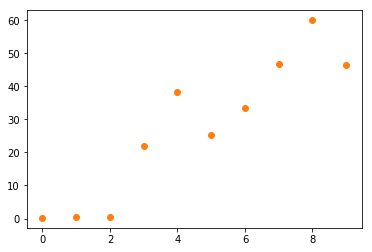

In [328]:
import matplotlib.pyplot as plt
plt.scatter(x=[i for i in range(t)], y=xopt)
plt.show()

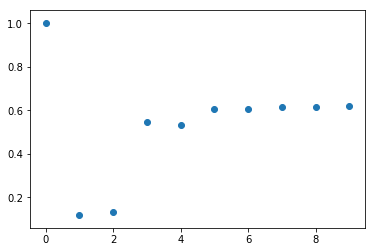

In [329]:
plt.scatter(x=[i for i in range(t)], y=variance)
plt.show()

In [331]:
variance1 = np.array([0.11863566909061336, 0.132878422946858, 0.5438975069491816, 0.53275519880763478, 0.60667966752833002, 0.60500023798681268, 0.61624423281320706, 0.61604531543160634, 0.61764026997206178])

In [332]:
xopt1 = np.array([0.37478325,   0.39678575,  22.0895824 ,
        38.14034211,  25.3788643 ,  33.4666809 ,  46.8369731 ,
        59.96757308,  46.48792752])

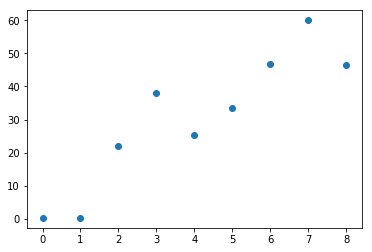

In [333]:
import matplotlib.pyplot as plt
plt.scatter(x=[i for i in range(9)], y=xopt1)
plt.show()

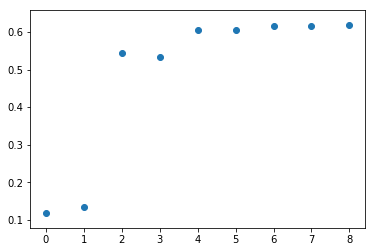

In [334]:
plt.scatter(x=[i for i in range(9)], y=variance1)
plt.show()

In [438]:
## formulate the real problem
import numpy as np
from pyswarm import pso

# Define the objective (to be minimize)
def tradeoff(eta, *args):
    import numpy as np
    rho, sigma, t, gama, k, r = args
    h = []
    m = []
    v = []
    u = []
    q = []
    p = []
    b1 = []
    b2 = []
    a1= []
    a2 = []
    va = []
    c =[]
    for i in range(t):
        if i==0:
            eta[i] = 0.2
            h1 = np.square(eta[i]) + np.square(gama)
            m1 = np.square(eta[i]*gama)
            
            v0 = 0.01
            v1 = np.square(rho) * v0 + np.square(sigma)
            u1 = 0.9
            #q1 = 0.9
            p1 = (k-1)/k*u1
            q1 = 1/k + p1
            
            b1_1 = np.square(gama)*v1*(1-r/k)
            b2_1 = (v1+np.square(gama))*(1-r/k)-r*(k-1)/k*(v1+np.square(gama)*u1)
            a1_1 = np.square(np.square(gama)*v1*(1-r/k))
            a2_1 = np.square(gama)*(np.square((1-r)*v1)+np.square((1-r*q1)*gama*sigma)+np.square((1-r*q1)*rho*gama)*v1)
            
            va_1 = 2
            
            c1 = 0.1/eta[i]
            
            h.append(h1)
            m.append(m1)
            v.append(v1)
            u.append(u1)
            p.append(p1)
            q.append(q1)
            b1.append(b1_1)
            b2.append(b2_1)
            a1.append(a1_1)
            a2.append(a2_1)
            va.append(va_1)
            c.append(c1)
        else:
            h2 = np.square(eta[i]) + np.square(gama)
            m2 = np.square(eta[i]*gama)
            l = h2*v[i-1]+m2
            
            w_theta = rho*m2/l
            w_x = np.square(eta[i])*v[i-1]/l
            
            v2 = v[i-1]*w_theta*rho+np.square(sigma)
            u2 = (1-w_theta/rho)*np.square(eta[i])/(np.square(eta[i])+np.square(gama))+w_theta/rho*u[i-1]
            
            p2 = (k-1)/k*u2
            q2 = 1/k + p2
            
            #q2 = (q[i-1]-1/k-(k-1)/k*w_x)/(w_theta/rho)+1/k
            
            b1_2 = np.square(gama)*v2*(1-r/k)
            b2_2 = (v2+np.square(gama))*(1-r/k)-r*(k-1)/k*(v2+np.square(gama)*u2)
            a1_2 = np.square(np.square(gama)*v2*(1-r/k))
            a2_2 = np.square(gama)*(np.square((1-r)*v2)+np.square((1-r*q2)*gama*sigma)+np.square((1-r*q2)*rho*gama)*va[i-1])
            
            va_2 = np.square(eta[i])*(a1[i-1]+a2[i-1]*np.square(eta[i]))/np.square(b1[i-1]+b2[i-1]*np.square(eta[i]))
            c2 = 0.1/eta[i]
            
            h.append(h2)
            m.append(m2)
            v.append(v2)
            u.append(u2)
            p.append(p2)
            q.append(q2)
            b1.append(b1_2)
            b2.append(b2_2)
            a1.append(a1_2)
            a2.append(a2_2)
            va.append(va_2)
            c.append(c2)
    su = sum(va[1:])+sum(c) 
    print('Cost: '+str(sum(c)))
    print('Variance Sum: '+str(sum(va)))
    print('Variance: '+str(va))
    print(su) 
    return su

def constraints(eta, *args):
    import numpy as np
    rho, sigma, t, gama, k, r = args
    v = np.array([])
    u = np.array([])
    
    for i in range(t):
        if i==0:
            v0 = 4
            v1 = np.square(rho) * v0 + np.square(sigma)
            u1 = 0.9
            
            v=np.append(v,v1)
            u=np.append(u,u1)
        else:
            h = np.square(eta[i]) + np.square(gama)
            m = np.square(eta[i]*gama)
            l = h*v[i-1]+m
            
            w_theta = rho*m/l
            w_x = np.square(eta[i])*v[i-1]/l
            
            v2 = v[i-1]*w_theta*rho+np.square(sigma)
            u2 = (1-w_theta/rho)*np.square(eta[i])/(np.square(eta[i])+np.square(gama))+w_theta/rho*u[i-1]
            
            v=np.append(v,v2)
            u=np.append(u,u2)
    con=1-u        
    return con

def constraints1(eta, *args):
    import numpy as np
    rho, sigma, t, gama, k, r = args
    c =[]
    for i in range(t):
        c1 = 0.1/eta[i]
        c.append(c1)
    cost = sum(c)  
    con = t*2 - cost
    return con


# Define the other parameters
rho = 1
sigma = 1
t = 20
gama = 1
k = 2
r = 0.5

args = (rho, sigma, t, gama, k, r)

# Define the lower and upper bounds for eta for t time steps, respectively
lb = np.ones(t)*0.01
ub = np.ones(t)*60

xopt, fopt = pso(tradeoff, lb, ub, args=args, f_ieqcons= constraints, phip = 0.5, phig = 0.5, swarmsize=100, maxiter=2000)

Cost: 0.603801032206
Variance Sum: 14.1471857588
Variance: [2, 0.76120403330377528, 0.84585067140306813, 0.63755910579362352, 0.65147875186996684, 0.62075668776454307, 0.62227202634406453, 0.61815476105334832, 0.61856028742126123, 0.61602206637799628, 0.61126280027368451, 0.60917720407364062, 0.61689743083755433, 0.61660998053972749, 0.61777385050344957, 0.61671309336838298, 0.61790772659532822, 0.61411754647156613, 0.61792318166621618, 0.61694455316552321]
12.750986791
Cost: 1.55430839034
Variance Sum: 13.573119838
Variance: [2, 0.76209388564040659, 0.84656628282125757, 0.63957420218526417, 0.65131639430519683, 0.62012806503965145, 0.0099713518376961397, 0.73892451724865071, 0.50604248044559952, 0.63958414692175958, 0.60100329084480231, 0.62085718885332308, 0.61543186244346682, 0.6183492506532261, 0.61674300660945003, 0.61798603714653533, 0.61764277259638867, 0.61794652162624941, 0.61593401172360029, 0.61702456906236702]
13.1274282283
Cost: 0.761147687975
Variance Sum: 13.8212234789
V

Variance Sum: 13.5529381261
Variance: [2, 0.76221738326755373, 0.83642733486222531, 0.63979170988624912, 0.65010422302754201, 9.9985649280642406e-05, 0.7537325137016585, 0.50359083597057608, 0.64146269718836446, 0.5911822602355673, 0.62023866163409058, 0.61335897963550301, 0.61824284672669794, 0.61686593141882051, 0.61737204523419298, 0.61757827899854922, 0.6172493811339953, 0.6178602656242258, 0.61775979162165051, 0.61780300027469526]
22.1419660282
Cost: 0.672251443651
Variance Sum: 13.9142422962
Variance: [2, 0.76216661538100161, 0.65739401945653397, 0.64760821872156915, 0.62436472720109415, 0.62152076232082965, 0.61887277070272362, 0.59577535516842728, 0.61817468749049742, 0.61147328087208841, 0.6044211805441243, 0.6169743866855959, 0.61576427935524169, 0.61725197398587528, 0.61439996241892358, 0.6176563767023826, 0.61714493624418443, 0.61780751563320369, 0.61770197268480265, 0.617769274594131]
12.5864937398
Cost: 10.6578730511
Variance Sum: 13.1670815956
Variance: [2, 0.76236993048

Cost: 20.5993343404
Variance Sum: 12.6735690233
Variance: [2, 0.76223520725435401, 9.9988222205007777e-05, 0.79410861039614011, 0.50403134761001578, 0.59386559547936946, 0.6007912081695026, 9.9985477213321159e-05, 0.73570868008550694, 0.50324800915865675, 0.6387455679579952, 0.60022438670740141, 0.6207931680318296, 0.61465292501699764, 0.61770559526563051, 0.61642969354049126, 0.61755103573025205, 0.61770019399890552, 0.6178273997901963, 0.61775042541203529]
31.2729033637
Cost: 10.7158165014
Variance Sum: 12.9720688452
Variance: [2, 0.76228809039500611, 9.9988222083919552e-05, 0.79414139318759125, 0.5040823191530861, 0.63972667958397622, 0.60060570780923794, 0.28917702919270566, 0.64958438754573522, 0.56366176392689282, 0.6227202718331053, 0.60911530056324781, 0.61841767371490663, 0.61573591106703607, 0.61756835328620963, 0.61446834147799168, 0.61765819321475812, 0.61734428388761442, 0.61789106355827172, 0.61778209354665448]
21.6878853465
Cost: 0.605370047959
Variance Sum: 14.156399593

Cost: 0.662466115457
Variance Sum: 14.0037291384
Variance: [2, 0.76234496464501478, 0.78702769109553217, 0.64128319531242106, 0.64315835358733886, 0.61883283461212446, 0.62151014095284585, 0.53879190066877458, 0.62110776353083619, 0.60444595636817122, 0.61201130433704243, 0.61373678476715154, 0.6170348011299287, 0.61721001114079532, 0.61708792207795349, 0.61729597537833081, 0.61753752726415156, 0.61774452949759706, 0.61772918817411193, 0.61783829388903166]
12.6661952539
Cost: 10.6561025305
Variance Sum: 13.1567491142
Variance: [2, 0.76235760707323141, 0.48110901284601709, 0.66407073605164424, 0.59681757562181348, 9.9985614575178453e-05, 0.73449675206377074, 0.5036064553973556, 0.6388886621007942, 0.5999252056272345, 0.62017460334632579, 0.61405426578847422, 0.61818113151419918, 0.61721802950139415, 0.61734777049086142, 0.61752140737269279, 0.61758202662521533, 0.61778494728712818, 0.61773944728756058, 0.6177734926241355]
21.8128516447
Cost: 0.583393750877
Variance Sum: 14.1583786907
Va

Variance: [2, 0.76235869119925315, 9.9988221922303063e-05, 0.7941872786243882, 0.50404854073261962, 0.56171085694407363, 0.60137402873101398, 0.55667762608521876, 0.61671738992456049, 0.60702324736785995, 0.61705640926298855, 0.615119718849366, 0.6176612408585983, 0.61740664852416793, 0.6176206530325995, 0.61758458315589104, 0.61770125997509973, 0.61772177433004427, 0.61771112762061664, 0.61779423354256668]
21.8302471648
Cost: 1.64823248586
Variance Sum: 12.5068781634
Variance: [2, 0.76230800771534935, 0.023310306504801336, 0.78319143754824028, 0.5094153758719957, 0.10199658426528864, 0.67006572574451373, 0.25029454016674163, 0.67684429395693368, 0.55476155484453293, 0.62698825039887807, 0.60664893691734723, 0.61912830432338495, 0.61605931518074497, 0.61759948819828392, 0.61734048508996775, 0.61771211363096667, 0.61774866726005884, 0.61771293244815506, 0.6177518433724607]
12.1551106493
Cost: 0.616009567757
Variance Sum: 14.1117091175
Variance: [2, 0.76027264906423542, 0.819867107863666

12.7476516201
Cost: 0.686707250706
Variance Sum: 13.7016951271
Variance: [2, 0.76233918032012471, 0.42000328420389338, 0.67245506250116616, 0.58666298271086148, 0.62590960060477185, 0.61302923424327616, 0.61506950315722309, 0.61705979856866444, 0.61501284342886398, 0.61756683596775375, 0.61575502276676675, 0.61738671434773607, 0.6174376846180516, 0.617552180663968, 0.61745746174317628, 0.6177375466894155, 0.61775897702593741, 0.61773628101985134, 0.61776493255494147]
12.3884023778
Cost: 0.63414535236
Variance Sum: 14.1056645711
Variance: [2, 0.76191582394551505, 0.84374792906223639, 0.63950458568623925, 0.65105982294240317, 0.60263864479669127, 0.62309119007837355, 0.58285375598097089, 0.61916071099724612, 0.61001297770905427, 0.6176216920246268, 0.61485272933423485, 0.61689740087136058, 0.61733499581375662, 0.61739555048308714, 0.61748612308346984, 0.61764309674048856, 0.61769349489457215, 0.61769749404609464, 0.61705655264784631]
12.7398099235
Cost: 10.7017674201
Variance Sum: 13.027

Cost: 0.576235308867
Variance Sum: 14.167194842
Variance: [2, 0.76186429235784514, 0.84604577648679224, 0.63942158931385074, 0.6511524665268944, 0.61892409898412504, 0.62269708232734367, 0.61746177460223939, 0.61835029940016362, 0.61647317655754408, 0.61773039690270437, 0.61718213904267971, 0.61603263673404485, 0.61766922351572318, 0.61729260469622271, 0.61784086751191181, 0.61756105046701704, 0.61786192382621297, 0.6177841434380984, 0.61784929928533516]
12.7434301508
Cost: 10.8082755489
Variance Sum: 12.7935142584
Variance: [2, 0.76234371943089763, 9.9988221956571943e-05, 0.79418212539627331, 0.50406266926838283, 0.5529966673133474, 0.6016423769105651, 0.18832159892762185, 0.67336695686897985, 0.54317911133544716, 0.62685506335527108, 0.60542047602226357, 0.61902321853809039, 0.61598463377923252, 0.61776697464670272, 0.61734003045447583, 0.61772358245809633, 0.61774829962362476, 0.61772479030662042, 0.61773197552235459]
21.6017898073
Cost: 0.584018742506
Variance Sum: 14.1579218285
Va

Cost: 1.04990098973
Variance Sum: 12.9170161638
Variance: [2, 0.76232203536452148, 0.13635570034661385, 0.73860575917845428, 0.53387787760293026, 0.55637347046440333, 0.60634143146199737, 0.19161005337414594, 0.67374634337203065, 0.54423612649369024, 0.6268591464314659, 0.60559064205801338, 0.61901502624546456, 0.61597573060583255, 0.61775808333950799, 0.61739122504676058, 0.61772769660885896, 0.6177759428380063, 0.61773460193961616, 0.6177192710230377]
11.9669171535
Cost: 1.12625343184
Variance Sum: 12.6929931511
Variance: [2, 0.76231638341647046, 0.20418246113712399, 0.71771428295355955, 0.54753236132724359, 0.1933389611495045, 0.65728678262329576, 0.20305015734872534, 0.68574320612714657, 0.54609224147479829, 0.628742376562475, 0.60579951631699414, 0.61926002570227845, 0.61601818210137171, 0.6177296869515182, 0.61727071351009188, 0.61772542528396324, 0.61774537101740012, 0.61772302665001033, 0.61772198945792756]
11.8192465829
Cost: 0.624602329768
Variance Sum: 14.0965715395
Variance

Variance Sum: 14.0963939956
Variance: [2, 0.76239298125999311, 0.79707269871728448, 0.6409317765312692, 0.6441641561463457, 0.61929145291127707, 0.62149463057652532, 0.61533123161103931, 0.61697034724192379, 0.61381613188514894, 0.61615149092006205, 0.60954952404069973, 0.61747791455013568, 0.61658802515731181, 0.61712515430598658, 0.61738018008803242, 0.61763953734699439, 0.61781170810876507, 0.61749983465062275, 0.61770521951859247]
12.7248443956
Cost: 1.20582288441
Variance Sum: 12.6329348623
Variance: [2, 0.76233971029665526, 0.13386250384387716, 0.73945638746526898, 0.53340333149108865, 0.13226998795136252, 0.66883710346024949, 0.25626409478062062, 0.67492908788349981, 0.55612445891412643, 0.62679686150365888, 0.60735968327601697, 0.61898421332505682, 0.61625836972570758, 0.61773346980510968, 0.61738140559959742, 0.61772606417773568, 0.61775637806962935, 0.61772401528566667, 0.61772773542326376]
11.8387577467
Cost: 1.2254719607
Variance Sum: 12.5829040594
Variance: [2, 0.762342111

Variance Sum: 14.1634298561
Variance: [2, 0.76236799268169497, 0.84572077553805569, 0.63949353423986655, 0.65049617172825391, 0.61981584515056776, 0.61991925537797643, 0.61762906292162867, 0.61808670290302548, 0.61731378732100872, 0.61710516349724298, 0.61522870287029685, 0.61773791847980253, 0.61727842591938753, 0.61741187886726412, 0.61727629960804897, 0.61767872520265876, 0.61741273673626806, 0.61777812837441148, 0.61767874872252893]
12.7499002796
Cost: 1.20896457845
Variance Sum: 12.5948915088
Variance: [2, 0.76234234072274321, 0.15087411457986272, 0.73380804864977023, 0.53689474904666312, 0.18695415563814208, 0.6559163600741521, 0.15495991305545037, 0.69946743060907279, 0.53652807847663186, 0.63121367845491316, 0.60438121170661252, 0.61965381345981085, 0.61581616460974964, 0.61782621906097901, 0.61731531293898934, 0.61773923578857737, 0.61774782944428275, 0.61773129469348609, 0.61772155775395632]
11.8038560872
Cost: 0.616444501287
Variance Sum: 14.1309340826
Variance: [2, 0.762019

Variance Sum: 12.6100490153
Variance: [2, 0.76234156851242951, 0.15431652080294719, 0.73269776502190198, 0.53759521448217773, 0.18486664316044027, 0.65659768082597625, 0.17025890466292903, 0.69503381860000735, 0.53959287487404639, 0.63041974960344349, 0.60484800426389762, 0.61952682963524763, 0.61588495102710616, 0.61780471474836474, 0.61732710544899427, 0.61773849060332975, 0.61774931650278742, 0.6177279695867357, 0.61772089290774279]
11.8036949137
Cost: 1.19598366711
Variance Sum: 12.6073182774
Variance: [2, 0.76234230157470506, 0.15010329807090331, 0.73405923015338326, 0.53673752013896803, 0.19713033875528363, 0.65348858283217381, 0.1621363204955957, 0.69652719690243647, 0.53798580391221462, 0.63069905132257809, 0.6046102084966023, 0.61957310396747689, 0.61584801111779131, 0.6178198988581598, 0.61731835133098611, 0.61773859814309695, 0.61774793981851872, 0.61773094507103277, 0.61772157646691173]
11.8033019445
Cost: 1.2051518391
Variance Sum: 12.5984377681
Variance: [2, 0.76234313052

Variance Sum: 12.6072171673
Variance: [2, 0.76234357203507774, 0.14912797901703961, 0.73437646562345393, 0.53653859118994862, 0.19248314574464559, 0.65451949123654174, 0.16667879504022723, 0.69547500740708668, 0.53892500676532906, 0.63049845476156596, 0.60475468993235781, 0.61954330618864872, 0.6158714535197729, 0.61781627792544502, 0.61732302848140286, 0.61773899183765313, 0.61774864468743695, 0.61773125893210856, 0.61772300700074512]
11.8031293537
Cost: 0.58648117405
Variance Sum: 14.1630876232
Variance: [2, 0.76240495956066179, 0.84639342355365077, 0.639435408237224, 0.65137530591257509, 0.6191926342959424, 0.62239912843607603, 0.6173320309103788, 0.61843966844061737, 0.6170170344781688, 0.61709361400462293, 0.61347670236523599, 0.61770738856888829, 0.61691291933643144, 0.61733997762520654, 0.61713694962857679, 0.61766989684118523, 0.61641893065543929, 0.61780475843861027, 0.61753689191096051]
12.7495687973
Cost: 1.19710899298
Variance Sum: 12.6060891799
Variance: [2, 0.762342562078

Variance: [2, 0.76234924901604084, 0.84225227723161822, 0.63969282093871493, 0.64984526720304114, 0.61568221033283621, 0.62261649460007429, 0.61728420717077581, 0.6183252695115965, 0.61760420865968435, 0.61684323522047013, 0.61778375513706374, 0.6176314912664187, 0.61778122802084368, 0.617727638192199, 0.61775107390151307, 0.61784192682688321, 0.61768357616750214, 0.61735663842549604, 0.61779633194691908]
12.7396589843
Cost: 0.640619561735
Variance Sum: 14.0270093242
Variance: [2, 0.76198641689845481, 0.84231659055114028, 0.63960413074544997, 0.65064899973363, 0.62054474133176218, 0.6224349353929608, 0.49407878242321229, 0.62472142501219174, 0.59716824394214119, 0.61856492482947212, 0.61467206727798485, 0.61783112579192179, 0.61738386897016617, 0.61784484589928068, 0.61761973310978036, 0.61720651595687503, 0.61719127123841633, 0.6174324312638737, 0.61775827385109172]
12.667628886
Cost: 0.610384820419
Variance Sum: 14.1278788213
Variance: [2, 0.76228249367482304, 0.8189341759611467, 0.6

Variance: [2, 0.76234384098153751, 0.15062067190445078, 0.73389104517593939, 0.53684311533043982, 0.19290204446554865, 0.65450489673188395, 0.16657994919393646, 0.69549858447632573, 0.5389047279201532, 0.63051509234103953, 0.60475187466827274, 0.61954657294053617, 0.61587117220598908, 0.61781817014165519, 0.61732313099846758, 0.61773992234961017, 0.61774854419184966, 0.61773120306173279, 0.61772460987172806]
11.8030872396
Cost: 1.1952850099
Variance Sum: 12.607798182
Variance: [2, 0.76234408904980666, 0.15025534191622161, 0.73400981946814203, 0.53676862833689742, 0.19245356996324792, 0.65458948060135791, 0.16611288378825168, 0.69566467987489311, 0.53881443603173784, 0.63054112712255217, 0.60473827029578309, 0.61955134422464619, 0.61586934844619323, 0.61781767676014576, 0.61732372387152656, 0.61773975138192116, 0.6177485864481016, 0.61773111216113707, 0.61772431228514046]
11.8030831919
Cost: 1.19610781679
Variance Sum: 12.6069745498
Variance: [2, 0.76234386213385397, 0.14956068743767656

Variance: [2, 0.7623440563564875, 0.15052057508826164, 0.73392361064341505, 0.53682274266211294, 0.1935130461834326, 0.65435660381650418, 0.16566870996808411, 0.69572645518967879, 0.53873381203776183, 0.63055230820404795, 0.60472491144702467, 0.61955232201241384, 0.6158666822676816, 0.61781991807074765, 0.61732435131653507, 0.61774009370701854, 0.61774862915774376, 0.61773139934264309, 0.61772549676336219]
11.8030551809
Cost: 1.19503440619
Variance Sum: 12.6080198632
Variance: [2, 0.76234389941427838, 0.14968731948003686, 0.73419434257095151, 0.53665276679026475, 0.19315697586921404, 0.65439327092590038, 0.16642703874506018, 0.69551057651018722, 0.53888895255549929, 0.63051053614656416, 0.60474875413631335, 0.61954571854425855, 0.61587064362840893, 0.61781925816370264, 0.61732473891815887, 0.61773979865185891, 0.61774870996175846, 0.61773114830365916, 0.61772541393108149]
11.8030542694
Cost: 1.19417925866
Variance Sum: 12.6088601516
Variance: [2, 0.76234375504520357, 0.1504215033672974

Cost: 1.19442377707
Variance Sum: 12.6085980454
Variance: [2, 0.76234388532889152, 0.15046325813618669, 0.73394212501051337, 0.53681100701418161, 0.19358274874141976, 0.65433744904778557, 0.16588616796393549, 0.69565543360611659, 0.53878654065684284, 0.63054127108885683, 0.6047388850373514, 0.61955049317760857, 0.61586947664223413, 0.61781961315834166, 0.61732429071867567, 0.61774001629199793, 0.61774862475203185, 0.61773112541054909, 0.61772563364454669]
11.8030218225
Cost: 0.595995097352
Variance Sum: 14.1550749528
Variance: [2, 0.76234560577092325, 0.84300393509584026, 0.63962234118955752, 0.65098246396563342, 0.61820897516037399, 0.62241717129296725, 0.61768812302132103, 0.61771305339771643, 0.61746886764285513, 0.61697756686650951, 0.61113389496233361, 0.61747737733711883, 0.61683828441119559, 0.61643534664929156, 0.61653470863756044, 0.61755443709104607, 0.61764069467179072, 0.6178105536220857, 0.6172215520180524]
12.7510700502
Cost: 1.19341719399
Variance Sum: 12.6096222999
Vari

Cost: 1.19444942202
Variance Sum: 12.6085364498
Variance: [2, 0.76234412015583042, 0.15054976775267126, 0.73391401232115816, 0.53682864088788662, 0.19396459246474651, 0.65425351913085561, 0.16539435697626459, 0.6957776399157809, 0.53869153592359309, 0.63056686311517007, 0.60473707518304221, 0.61955453547449602, 0.61586950715155075, 0.6178199573241091, 0.61732440487437268, 0.61774005334832127, 0.61774862339514169, 0.61773125048391753, 0.61772599391659366]
11.8029858718
Cost: 1.19378014486
Variance Sum: 12.6092077267
Variance: [2, 0.76234413241706989, 0.15103687650793049, 0.73375598446157608, 0.53692792146945245, 0.19396570289532425, 0.65428004673451323, 0.1656268958254693, 0.69571549654082587, 0.53873603087303745, 0.63055712390523955, 0.60474740690717599, 0.61955308002783938, 0.61587113215890599, 0.61781938719263518, 0.6173246371722737, 0.61774001499510323, 0.61774865936910173, 0.61773124803143054, 0.61772594921405677]
11.8029878716
Cost: 0.625632550249
Variance Sum: 14.0634032641
Varia

11.8029674025
Cost: 0.578919575341
Variance Sum: 14.1673490349
Variance: [2, 0.76238233412073075, 0.84636495142113177, 0.6395520363397611, 0.65128962949162372, 0.61997637098609504, 0.62217582789405057, 0.61772418801223739, 0.61843189186306624, 0.61726290528877825, 0.61709679430485687, 0.61584539306741226, 0.61774333320102059, 0.6171572197549039, 0.617413450522736, 0.61686571554392489, 0.61768099380593156, 0.61696466130221805, 0.61780358493484988, 0.6176177530885939]
12.7462686103
Cost: 1.19436897579
Variance Sum: 12.6085905034
Variance: [2, 0.76234415409745693, 0.15053881103499359, 0.73391759948562962, 0.53682640875712562, 0.1941657444172214, 0.65420632475968599, 0.16529013498183759, 0.69579455747008201, 0.5386755601434251, 0.6305700019446232, 0.60474450933724255, 0.61955487657586572, 0.61587048330781702, 0.61782074925642461, 0.61732461523136306, 0.61774016709557245, 0.61774866238516568, 0.61773126072472428, 0.61772588237167225]
11.8029594792
Cost: 0.606421152244
Variance Sum: 14.14245

In [439]:
xopt

array([  0.2       ,  48.63824624,   0.42691398,  52.28016319,
        42.86469194,   0.52115387,  31.79708263,   0.47494683,
        33.24405734,  12.60267907,  19.81905476,  13.91876525,
        28.24721705,  36.28796536,  25.68683693,  26.97273917,
        33.02269551,  39.69314432,  33.20362306,  32.78707819])

In [440]:
variance = np.array([2, 0.76234411228011612, 0.15003231583475699, 0.73408213554124135, 0.53672311821701912, 0.19452086122006057, 0.65409603559039042, 0.16502033572235078, 0.69584232365184084, 0.5386267598112805, 0.63057792939916124, 0.60474853327551081, 0.61955573910469419, 0.6158710694181414, 0.61782193532408924, 0.61732471333423578, 0.61774033942476148, 0.61774868124931837, 0.61773127256983418, 0.61772583894387745])

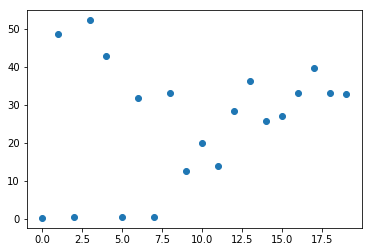

In [441]:
plt.scatter(x=[i for i in range(t)], y=xopt)
plt.show()

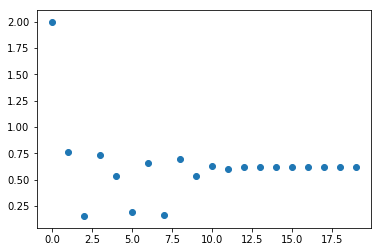

In [442]:
plt.scatter(x=[i for i in range(t)], y=variance)
plt.show()

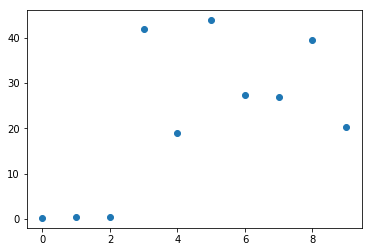

In [272]:
plt.scatter(x=[i for i in range(t)], y=xopt)
plt.show()

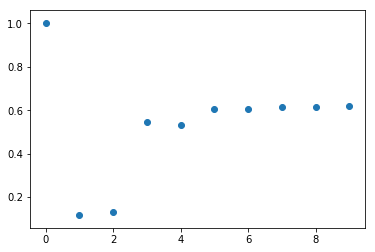

In [273]:
plt.scatter(x=[i for i in range(t)], y=variance)
plt.show()

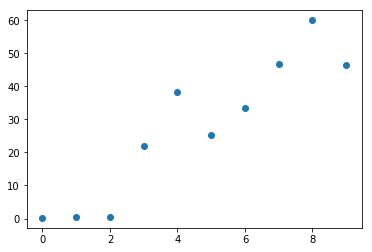

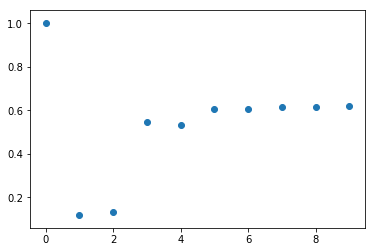

In [319]:
plt.scatter(x=[i for i in range(t)], y=variance)
plt.show()